# Introduction To Rusty Axe

This notebook will give you a guided tour through using Rusty Axe.

We'll use the iris toy dataset for simplicity and speed, but if you have a dataset you wish to analyize, you should feel free to copy this notebook and swap out the iris matrix for a matrix or an input/output pair of your choice!

Brief note about system requirements: the advantage of Random Forest Regressors is that they can run fairly efficiently by down-sampling large datasets during bootstrapping. You will need enough memory to fully load your dataset, but once it is loaded, the memory requirement per extra thread will depend on your bootstrapping settings. If you are running this on a laptop or personal machine, feel free to do a test run with the setting p=1. This will restrict the RF to a single thread and allow you to monitor memory usage. 

## Loading The Data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
# import scanpy as sc

import pickle 

data_location = "../data/iris/"

iris = np.loadtxt(data_location + "iris.tsv")
iris_features = np.loadtxt(data_location + "header.txt",dtype=str)

Firstly we will need to train a random forest regressor describing our data. We recommend starting with the built-in RFR because it has better support for unsupervised forests, but support for sk-learn based forests is also available. 

We need to describe several important settings here.

In [2]:
from rusty_axe import lumberjack

forest = lumberjack.fit(
    iris, 
    # Input: n by m numpy array. Rows should be samples, columns should be features (eg genes or measurements)
    # If only one array is provided, Rusty Axe defaults to unsupervised mode, where features with the same name 
    # cannot be in both the input and the output.

    header=iris_features,
    # Header of feature names. This will be enormously helpful for interpretation, so we recommend providing it here.

    trees=500,
    # Numer of trees to train. For multi-output forests such as scRNAseq data, the number of unique trees is 
    # generally less important than the depth, so try it with 100 first. 
    # See saturation analysis tutorial for more information. 
    
    input_feature_subsample=2,
    # Input feature subsampling rate, eg how many features can potentially be split on at each bootstrap. 
    # Rule of thumb: use 1/2 to 1/3 of all features. (eg if you are observing 2000 variable genes, say 700 here)
    
    output_feature_subsample=2,
    # Output feature subsampling rate, eg how many features are evaluated for improvement in dispersion at each 
    # bootstrap. Apply similar rule of thumb as to inputs. 
    
    ss=50,
    # Sample subsampling rate. Number of samples evaluated at each bootstrap. This parameter depends on how 
    # "grainy" your data is. If you are looking for small, rare clusters first, the rule of thumb should be
    # to use higher values (500-1000).
    # Conversely, if you are looking big, obvious clusters first, leave this value small (150-300)
    
    
    depth=3,
    # Maximum depth of each tree. 
    # This value determines the complexity of the factors you will obtain. 
    # If your data isn't very complicated leave this value low (~5-6)
    # If your data has a lot of complexity and heterogeneity, set this value higher (8-10)

    
    sfr=0,
    norm='l1',
    dispersion_mode = "ssme",
    standardize = "true",
    # These are helpful defaults for the optimization metric to use. For more details please refer to the 
    # optimization metric tutorial. 
    

    reduce_input='false',
    reduce_output='false',
    # These parameters dictate whether or not dimensional reduction is applied at each node split. 
    # For sparse data such as scRNAseq this can be enormously helpful in making more highly interpretable trees
    # On the other hand if your data is poorly behaved under dimensional reduction, this setting can be left off. 
    
    cache = True
    # This setting is true by default, but please keep it in mind if you need to train a very large
    # forest, or one with a huge number of features. 
    # This setting prevents Python from caching a variety of values within individual nodes, potentially saving
    # much space in memory, but it slows down all computations considerably. 

    # Set this to false when you wish to train a very large forest and then immediately filter it to a smaller
    # forest based on some criterion. 
)

Setting context
Input:(150, 4)
Output:(150, 4)
Generating trees
Running /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/bin/rf_5
Command: /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/bin/rf_5 -ic /tmp/tmp4ca7aqtr/input.counts -oc /tmp/tmp4ca7aqtr/output.counts -o /tmp/tmp4ca7aqtr/tmp -auto -ifh /tmp/tmp4ca7aqtr/tmp.ifh -ofh /tmp/tmp4ca7aqtr/tmp.ofh -trees 500 -input_feature_subsample 2 -output_feature_subsample 2 -ss 50 -depth 3 -sfr 0 -norm l1 -dispersion_mode ssme -standardize true -reduce_input false -reduce_output false
Read parameters

5.1 0
100
150,4

5.1 0
100
150,4
Reading header: /tmp/tmp4ca7aqtr/tmp.ifh
Read 4 lines
Reading header: /tmp/tmp4ca7aqtr/tmp.ofh
Read 4 lines
Computing tree 0
Computing tree 15
Computing tree 7
Computing tree 250
Computing tree 11
Computing tree 62
Computing tree 23
Computing tree 312
Computing tree 125
Computing tree 31
Computing tree 343
Computing tree 24
Computing tree 63
Computing tree 1
Computing tree 16
Computing tr

Loading /tmp/tmp4ca7aqtr/tmp.tree_237.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_238.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_239.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_24.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_240.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_241.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_242.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_243.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_244.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_245.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_246.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_247.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_248.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_249.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_25.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_250.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_251.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_252.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_253.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_254.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_255.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_25

Loading /tmp/tmp4ca7aqtr/tmp.tree_415.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_416.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_417.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_418.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_419.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_42.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_420.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_421.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_422.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_423.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_424.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_425.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_426.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_427.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_428.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_429.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_43.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_430.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_431.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_432.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_433.compact
Loading /tmp/tmp4ca7aqtr/tmp.tree_43

In [3]:
forest.backup("./iris_forest")
# Forests aren't determsinistic in nature, so if you wish to continue an analysis that you started, 
# don't depend on repeating the same calculations and getting an exactly identical answer. For convenience 
# we instead provide this method of saving a forest so that you can reload it later. 
# Most computations should be cached in the saved forest, but save after each computation you wish to cache!

Saving forest
./iris_forest


## Analyzing Nodes 

In [4]:
len(forest.nodes())


7224

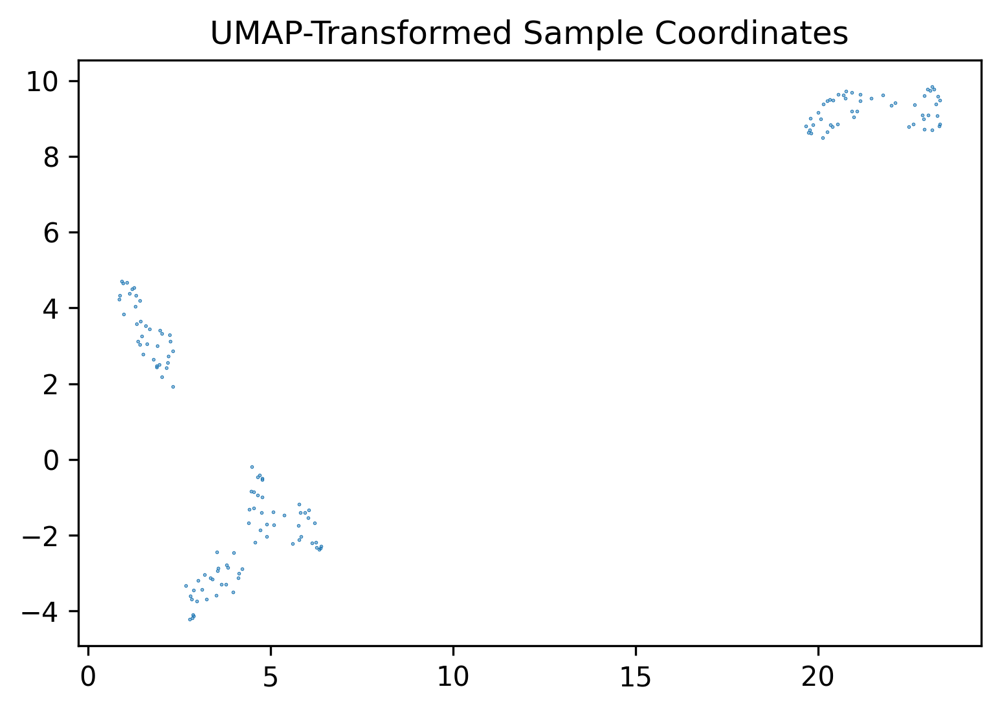

/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


array([[ 1.2981519 ,  1.3277738 ],
       [ 1.5965749 ,  1.3226702 ],
       [ 1.5459826 ,  1.2254854 ],
       [ 1.5659378 ,  1.223465  ],
       [ 1.3238003 ,  1.3425812 ],
       [ 1.2008517 ,  1.1746635 ],
       [ 1.518937  ,  1.1769263 ],
       [ 1.3506732 ,  1.298774  ],
       [ 1.5992478 ,  1.1656821 ],
       [ 1.5769944 ,  1.3724353 ],
       [ 1.2182416 ,  1.2376562 ],
       [ 1.448993  ,  1.273795  ],
       [ 1.6024966 ,  1.3028064 ],
       [ 1.5782347 ,  1.1463953 ],
       [ 1.1790766 ,  1.1653638 ],
       [ 1.1858103 ,  1.13192   ],
       [ 1.1897869 ,  1.1450385 ],
       [ 1.3056837 ,  1.3482691 ],
       [ 1.1934866 ,  1.2061604 ],
       [ 1.2464178 ,  1.1373235 ],
       [ 1.2546747 ,  1.3055058 ],
       [ 1.2779466 ,  1.1781931 ],
       [ 1.5042597 ,  1.1634285 ],
       [ 1.3241911 ,  1.2426264 ],
       [ 1.4606864 ,  1.2896495 ],
       [ 1.5829865 ,  1.3573041 ],
       [ 1.3406624 ,  1.2456622 ],
       [ 1.2647064 ,  1.3013067 ],
       [ 1.2804074 ,

In [5]:
# Firstly we can visualize an embedding of our data using TSNE or UMAP to get a feel for the distribution of 
# the underlying values

forest.coordinates(type='umap')

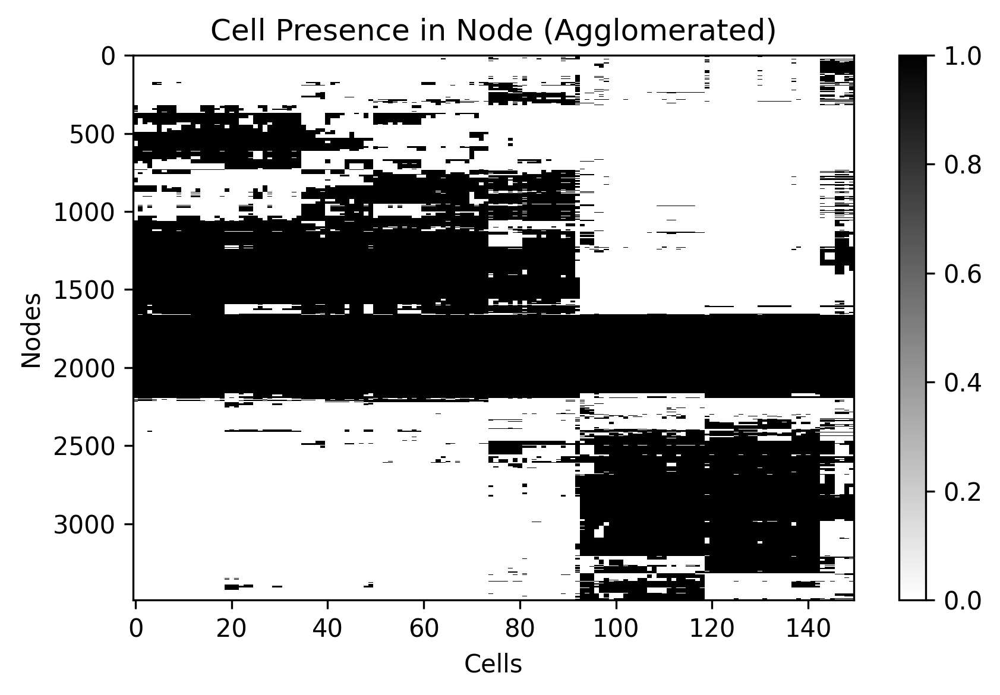

In [6]:
# Now we can take a quick look at the nodes in our forest. 

nodes = forest.nodes(
    depth = 2
    # So as not to overwhelm our computer we can work with nodes of a restricted depth for the moment.
    # (of course an iris definitely won't overwhelm your computer, but if you are following along 
    # with this tutorial using a larger dataset, restricting the depth here will be very helpful. try depth=5)
)

# We will construct some representations of our nodes and visualize them to get an idea of what's happening in 
# our forest

node_sample_encoding = forest.node_representation(nodes,mode='sample')
# A node sample encoding is a binary matrix of node x sample. Each element i,j is 1 if node i contains sample j,
# and 0 otherwise. 

# If nodes frequently contain the same samples, this will likely indicate that those samples are similar in some way.

from scipy.cluster.hierarchy import linkage,dendrogram

sample_agglomeration = dendrogram(linkage(node_sample_encoding.T, metric='cosine', method='average'), no_plot=True)['leaves']
node_sample_agglomeration = dendrogram(linkage(node_sample_encoding, metric='cosine', method='average'), no_plot=True)['leaves']

plt.figure()
plt.title("Cell Presence in Node (Agglomerated)")
plt.imshow(node_sample_encoding[node_sample_agglomeration].T[sample_agglomeration].T,cmap='binary',aspect='auto',interpolation='none')
plt.xlabel("Cells")
plt.ylabel("Nodes")
plt.colorbar()
plt.tight_layout()
plt.show()


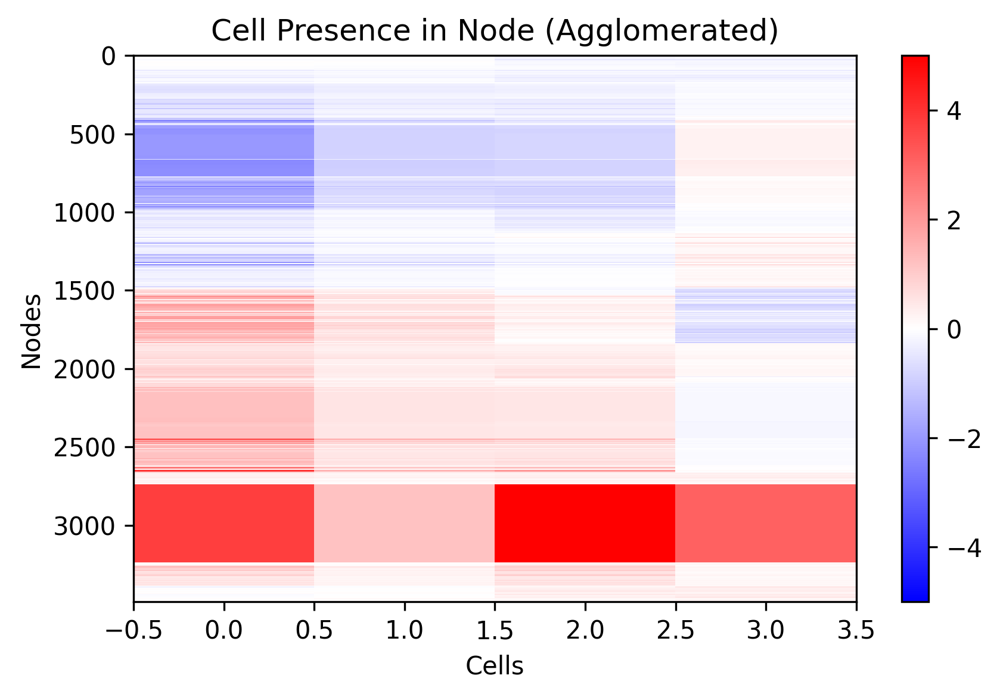

In [7]:
# Now let's look at a few other kinds of encodings

node_gain_encoding = forest.node_representation(nodes,mode='conditional_gain')

# A conditional gain encoding is a matrix of nodes x features, where element i,j is the difference in the mean for
# feature j in node i compared to the parent of node i. It represents the "prediction" or regression that each 
# node makes. 

feature_agglomeration = dendrogram(linkage(node_gain_encoding.T, metric='cosine', method='average'), no_plot=True)['leaves']
node_gain_agglomeration = dendrogram(linkage(node_gain_encoding, metric='cosine', method='average'), no_plot=True)['leaves']

plt.figure()
plt.title("Cell Presence in Node (Agglomerated)")
plt.imshow(node_gain_encoding[node_gain_agglomeration].T[feature_agglomeration].T,cmap='bwr',vmin=-5,vmax=5,aspect='auto',interpolation='none')
plt.xlabel("Cells")
plt.ylabel("Nodes")
plt.colorbar()
plt.tight_layout()
plt.show()

In [8]:
# Now let's cluster the nodes of our RFR and see if any patterns emerge. 

forest.interpret_splits(
    mode='partial',
    resolution=1,
    k=200,
    pca=4
)

Node 6000

Node 6000

Complete:6723

Searching for partition
Louvain: (6724,)


array([8, 9, 7, ..., 4, 5, 0])

In [9]:
forest.maximum_spanning_tree(
    mode='samples'
)

Max tree debug
[[0.99972559 0.97812999 0.89243278 0.88789448 0.99894952 0.99897034
  0.8824318  0.93068012 0.70683965 0.7079118  0.89657822 0.92514746]
 [0.80499338 0.835892   0.64181836 0.65433729 0.80865043 0.80628037
  0.64186626 0.83122284 0.66011291 0.66056558 0.65299522 0.65089313]
 [0.69057501 0.58976122 0.82428224 0.86359314 0.67157208 0.67264468
  0.87758156 0.47554973 0.13263066 0.13423084 0.87230813 0.72775049]
 [0.84857071 0.7698472  0.92086419 0.88923172 0.83971781 0.84194952
  0.86989383 0.67518784 0.37455023 0.37559258 0.87617688 0.96109419]
 [0.66837523 0.78833655 0.26196155 0.24957326 0.69141174 0.68851118
  0.24056252 0.87825963 0.99388134 0.99375074 0.27040388 0.37250955]
 [0.80929318 0.68596855 0.98488001 0.98769093 0.79043572 0.79279191
  0.98708583 0.55213293 0.16447993 0.16597617 0.98277175 0.94316925]
 [0.68083578 0.59098592 0.78720975 0.81204654 0.66354942 0.66419423
  0.8356111  0.48799229 0.17169949 0.17295544 0.82574643 0.73371518]
 [0.85578158 0.88437349 0.

[0,
 [[1, []],
  [4, [[8, []], [9, []]]],
  [5, [[2, []], [3, [[11, []]]], [6, []], [10, []]]],
  [7, []]]]

Now we would like to visualize the approximate consensus tree structure in our random forest. 

The next function should provide you with an HTML report of the forest. (Please be patient, it takes a little while to render the complete report) 

Summarizing:0
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[101.96440452  27.95668663 462.93785762  86.60652029],A:[nan nan nan nan]
Error ratio: [nan nan nan nan]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


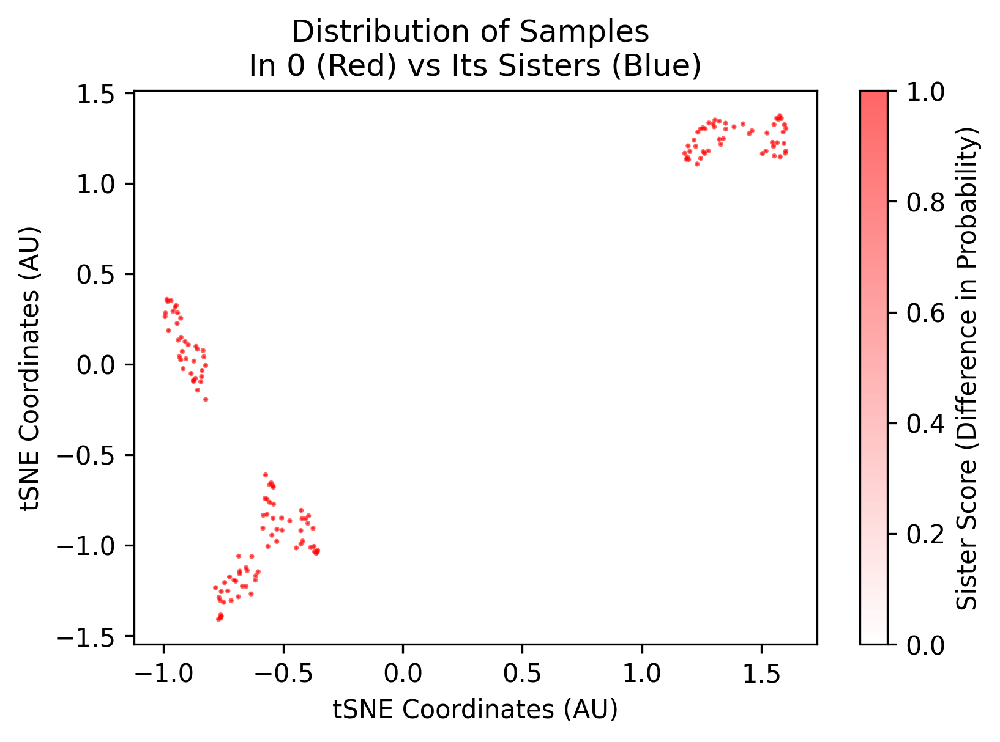

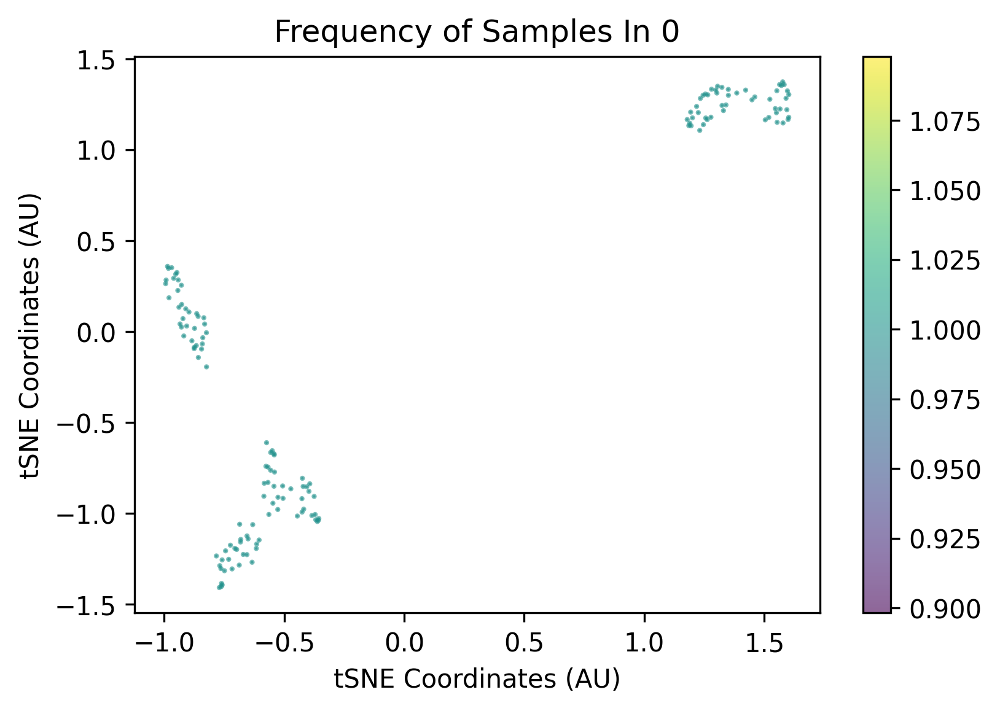

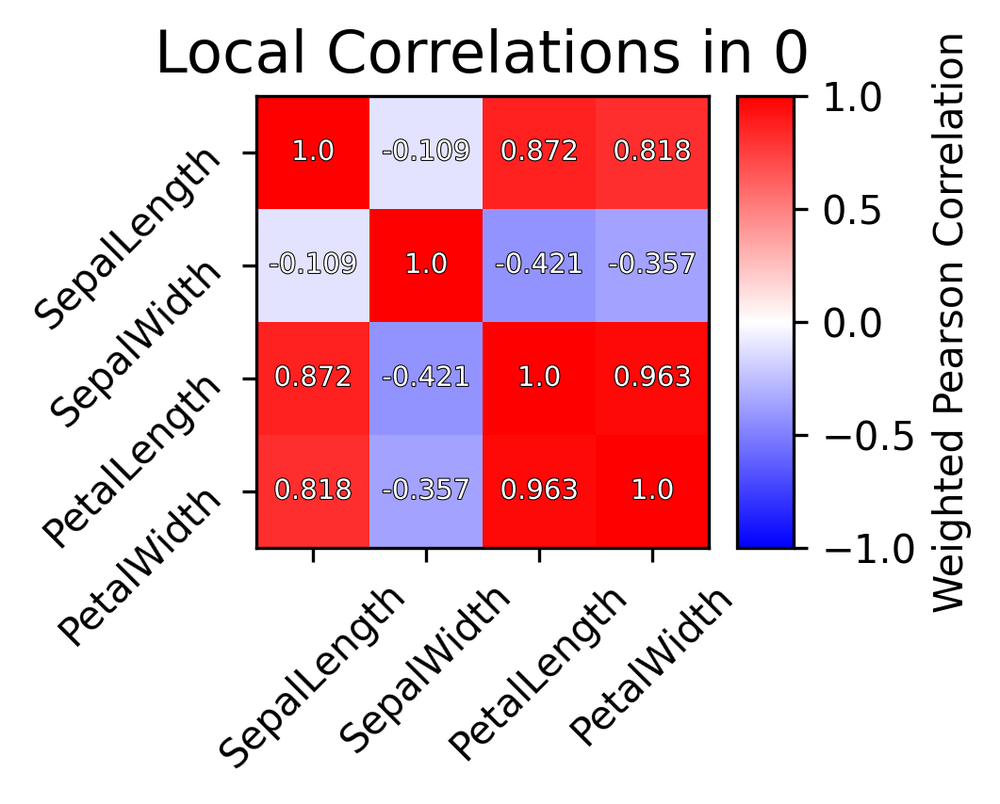

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


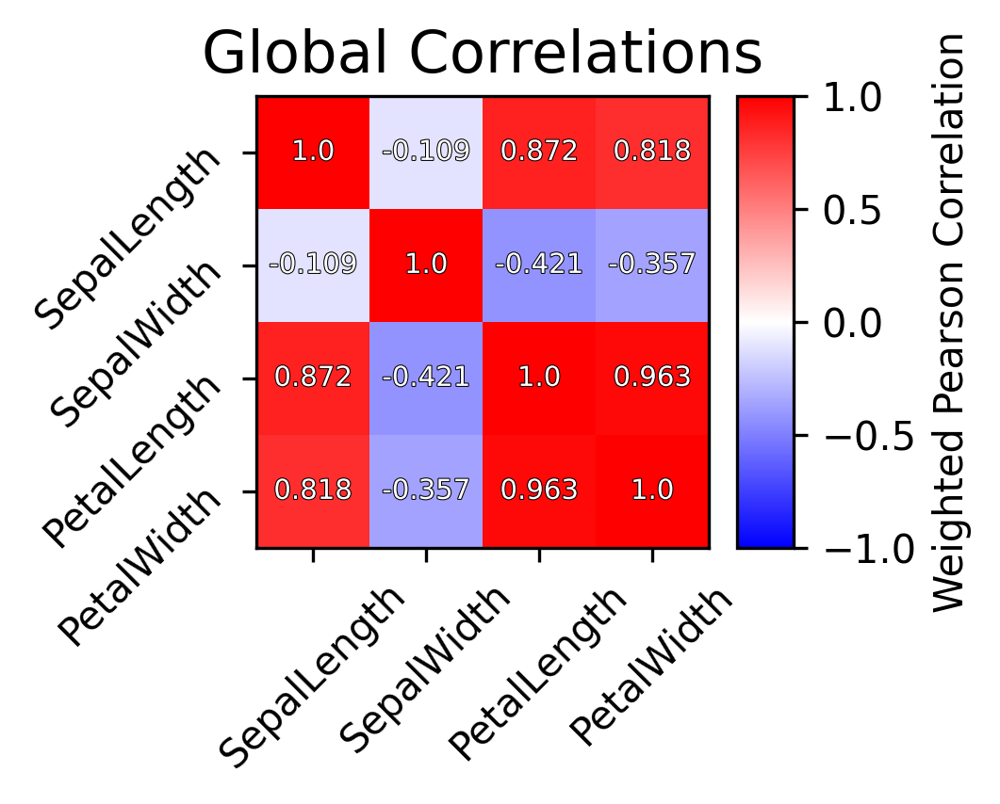

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/0/
Summarizing:1
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[16.82366106  4.71902235 95.20809868 17.76485056],A:[19.10709579  4.98053576 95.35077099 18.06778299]
Error ratio: [0.88643637 0.95627258 0.99851924 0.98411287]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


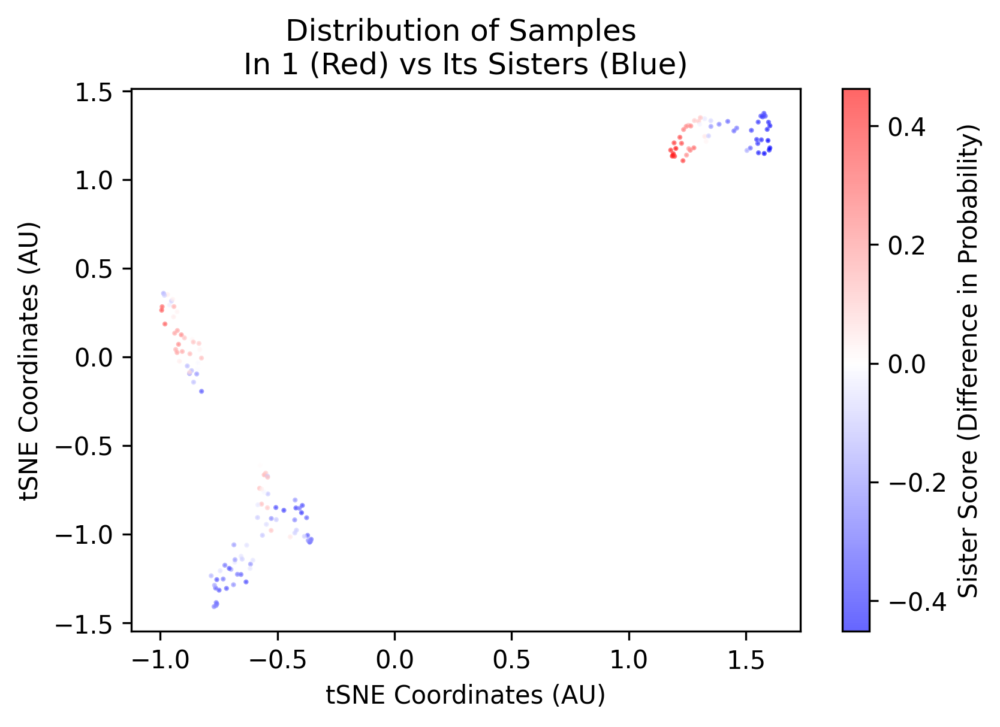

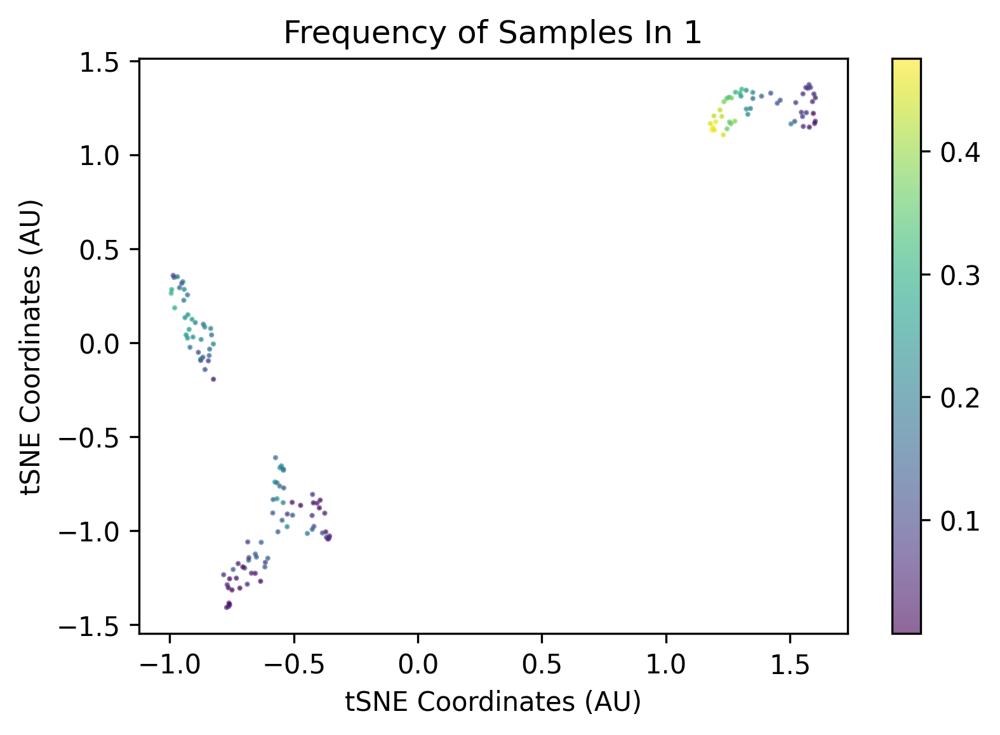

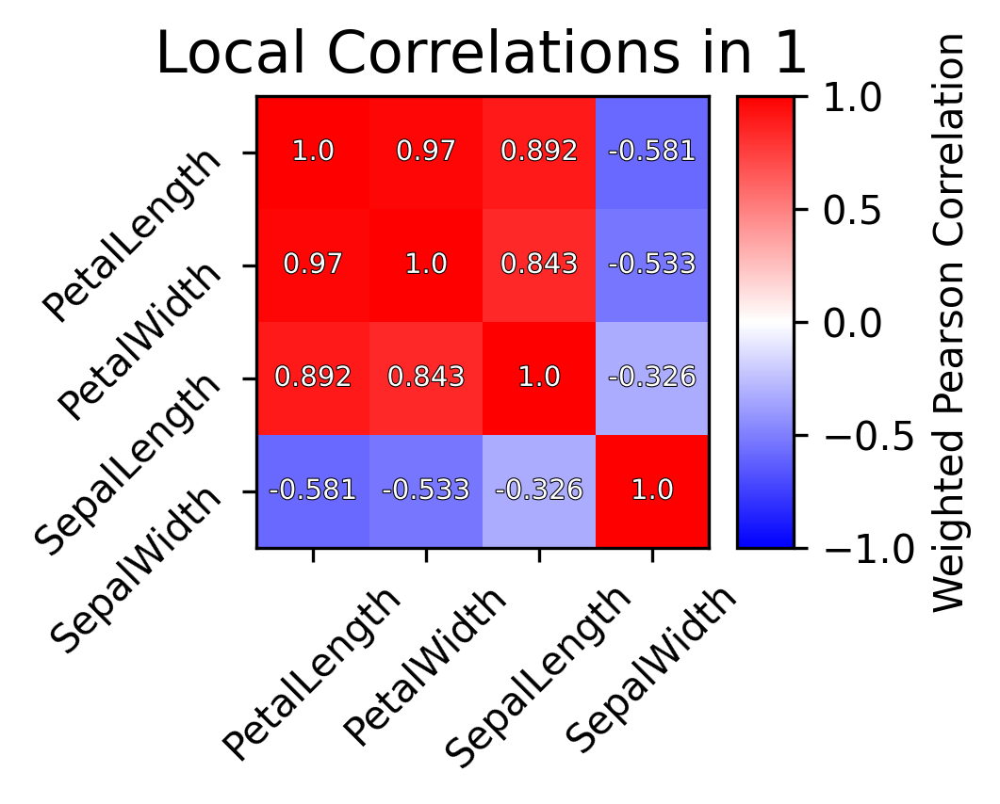

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


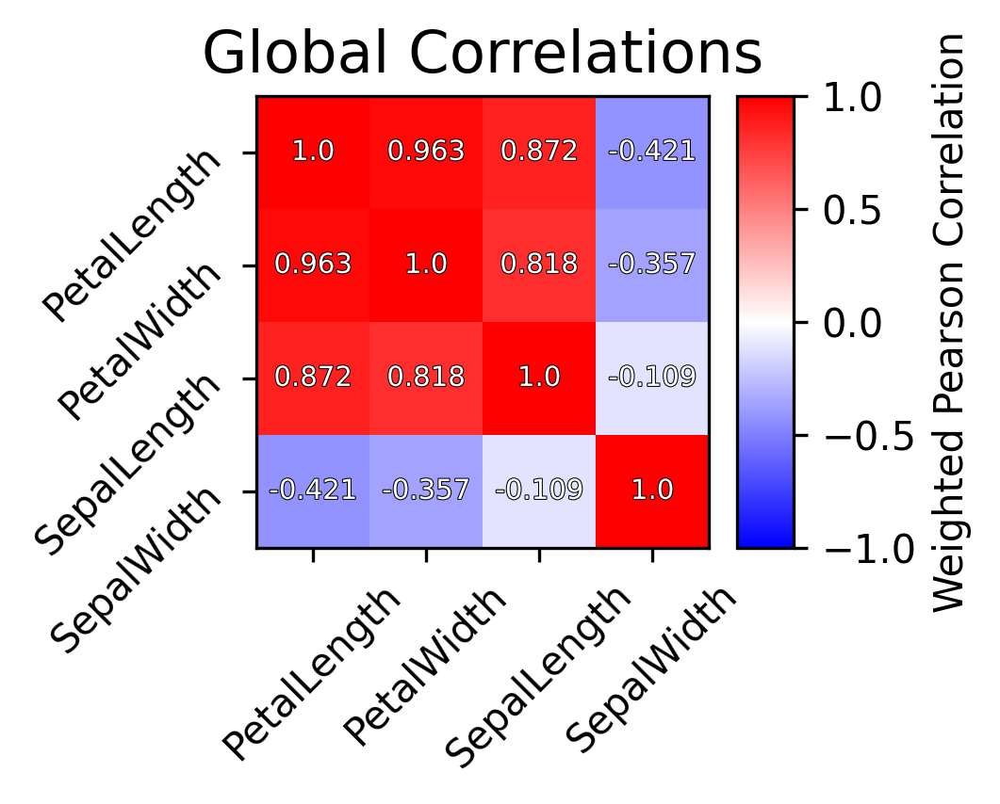

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/1/
Summarizing:2
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[12.1082824   2.86078578 28.57879892  6.16033721],A:[15.71782107  2.86903049 45.51919096 10.67368125]
Error ratio: [0.78409036 0.99786905 0.63584079 0.6133744 ]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


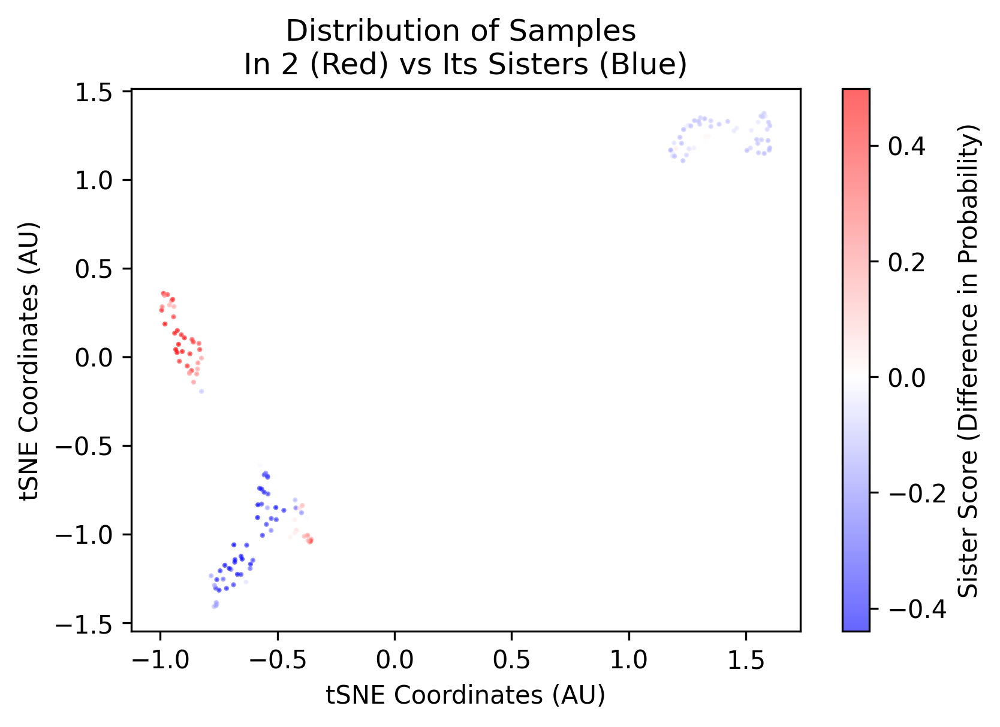

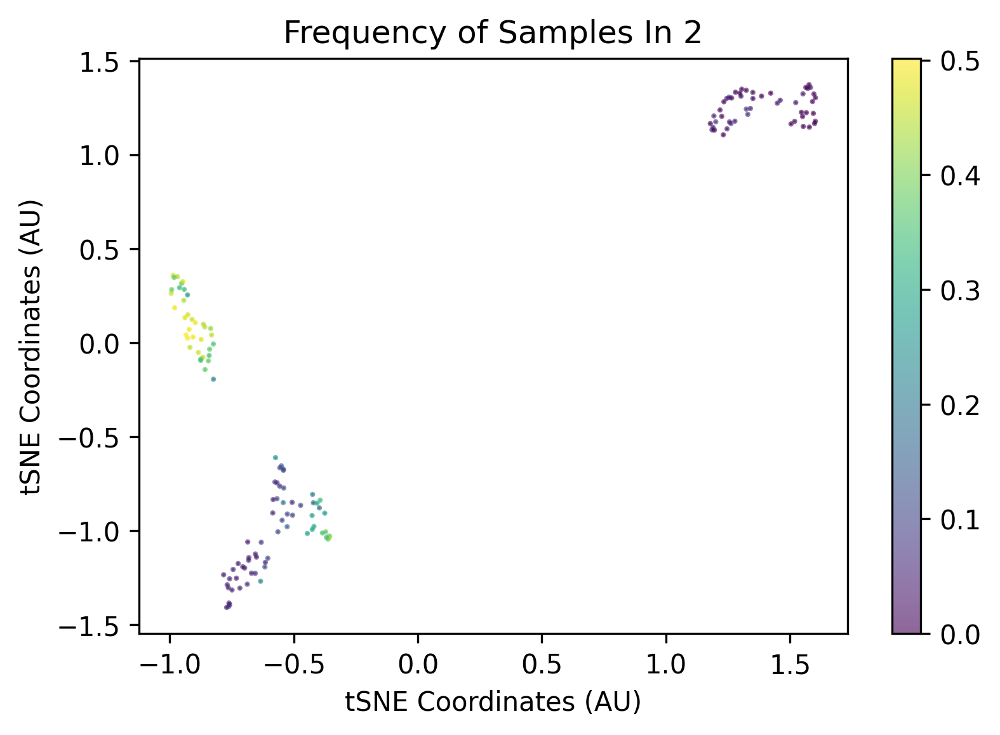

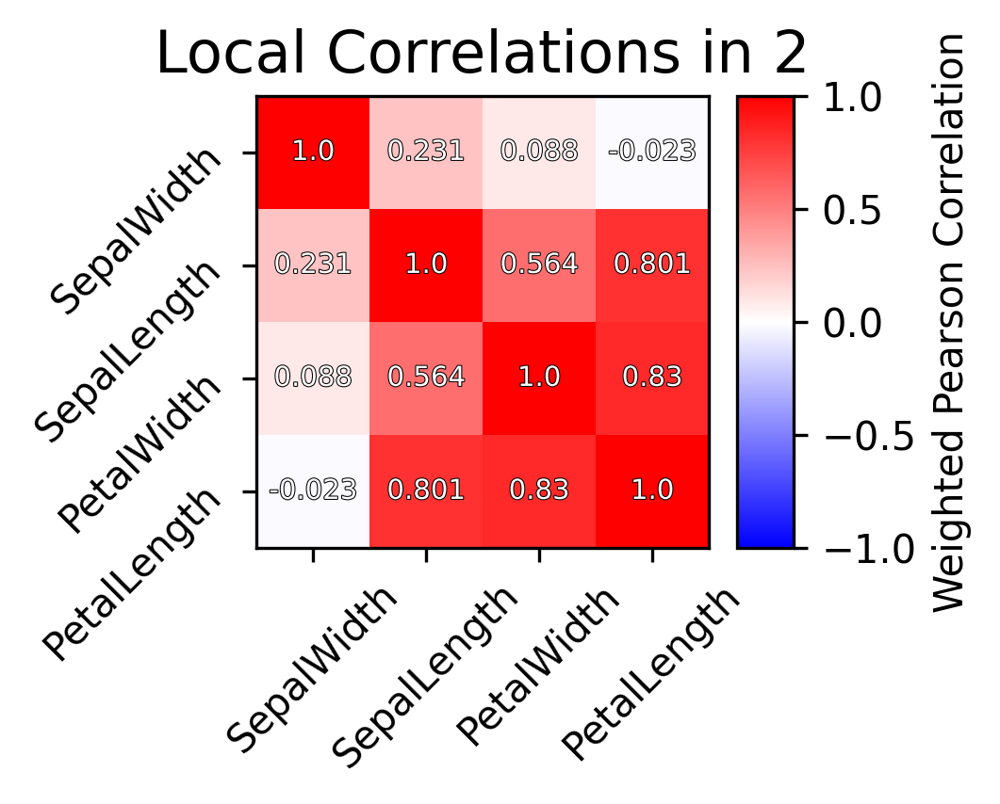

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


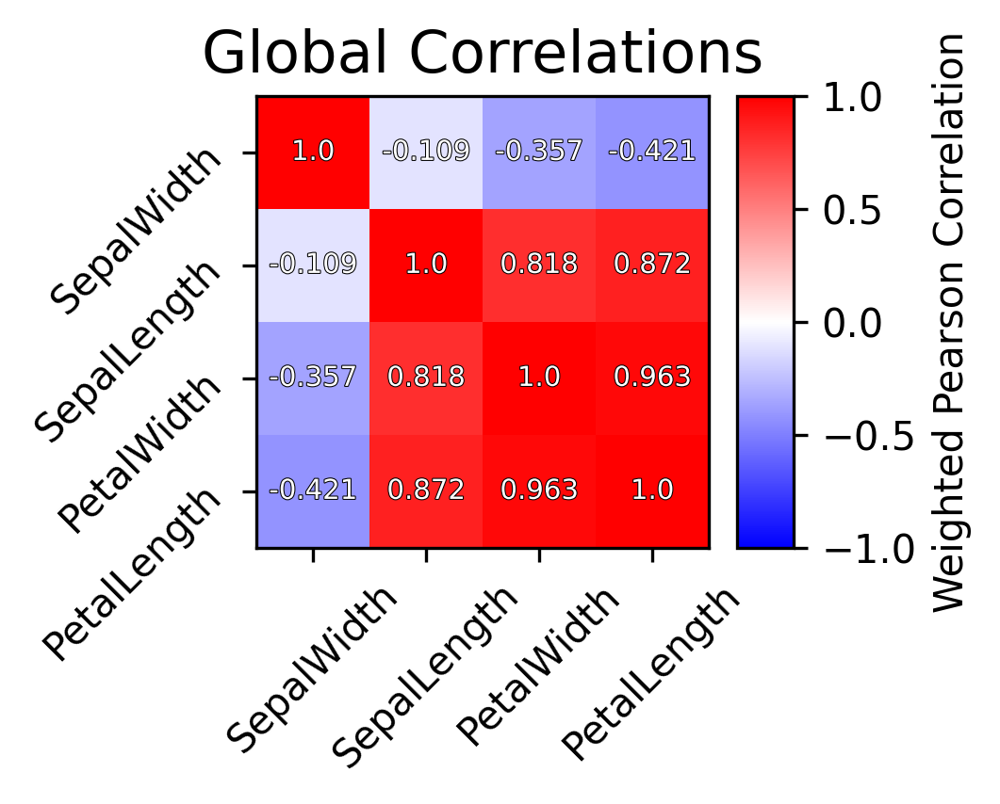

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/2/
Summarizing:3
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[17.04915366  4.75968381 62.11847623 11.26445377],A:[18.10705858  5.21016478 64.01445155 12.13168216]
Error ratio: [0.94463277 0.92746071 0.97083763 0.93395908]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


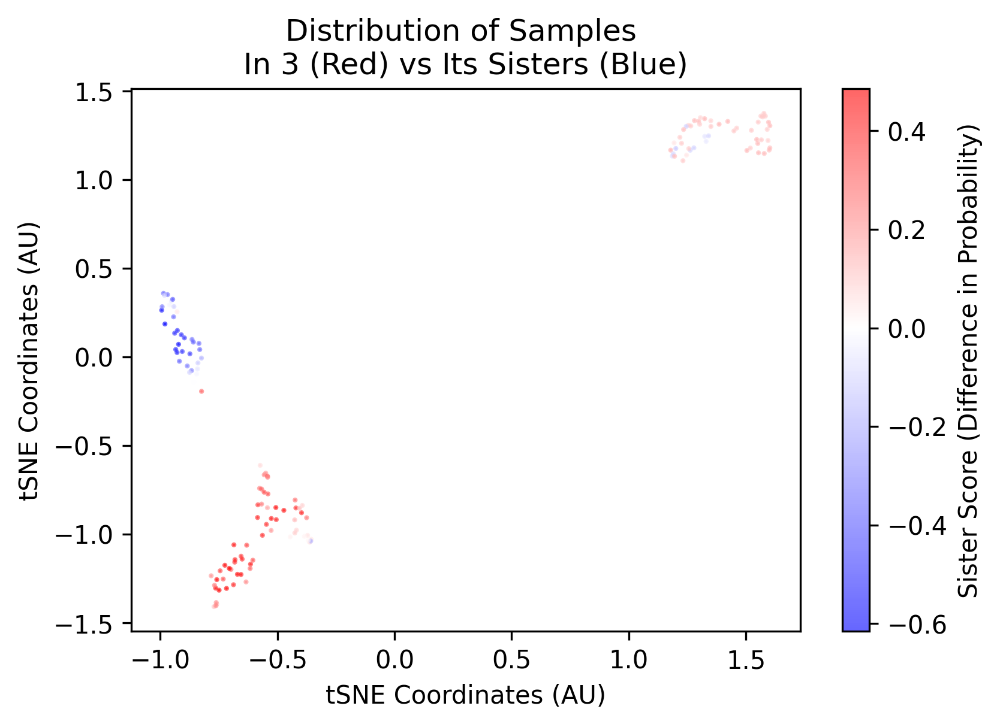

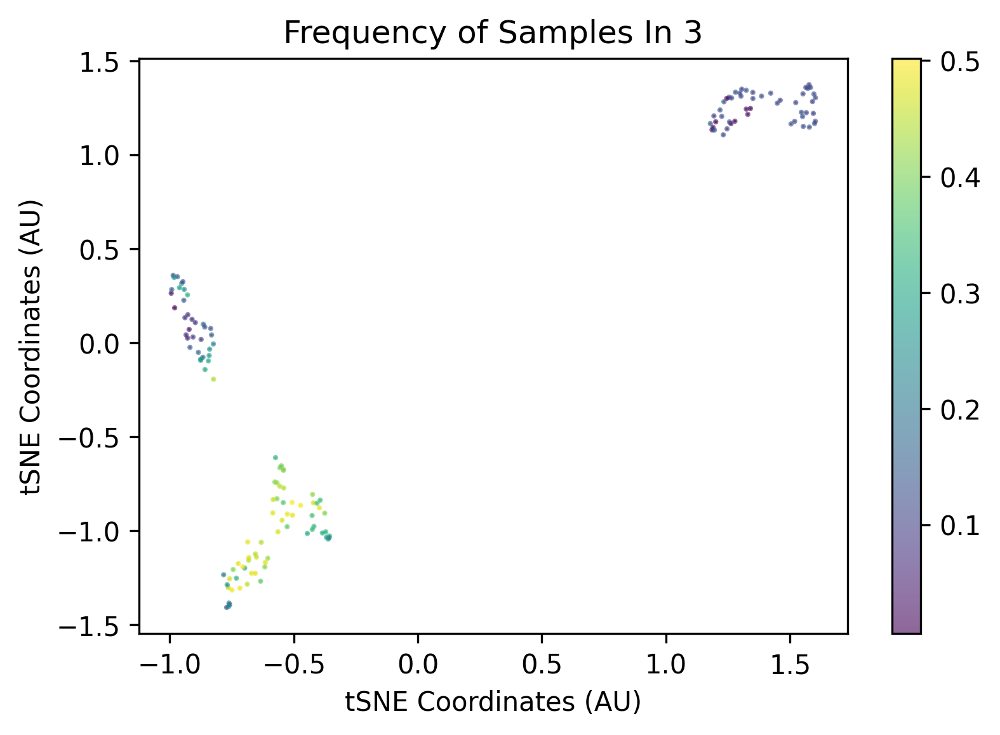

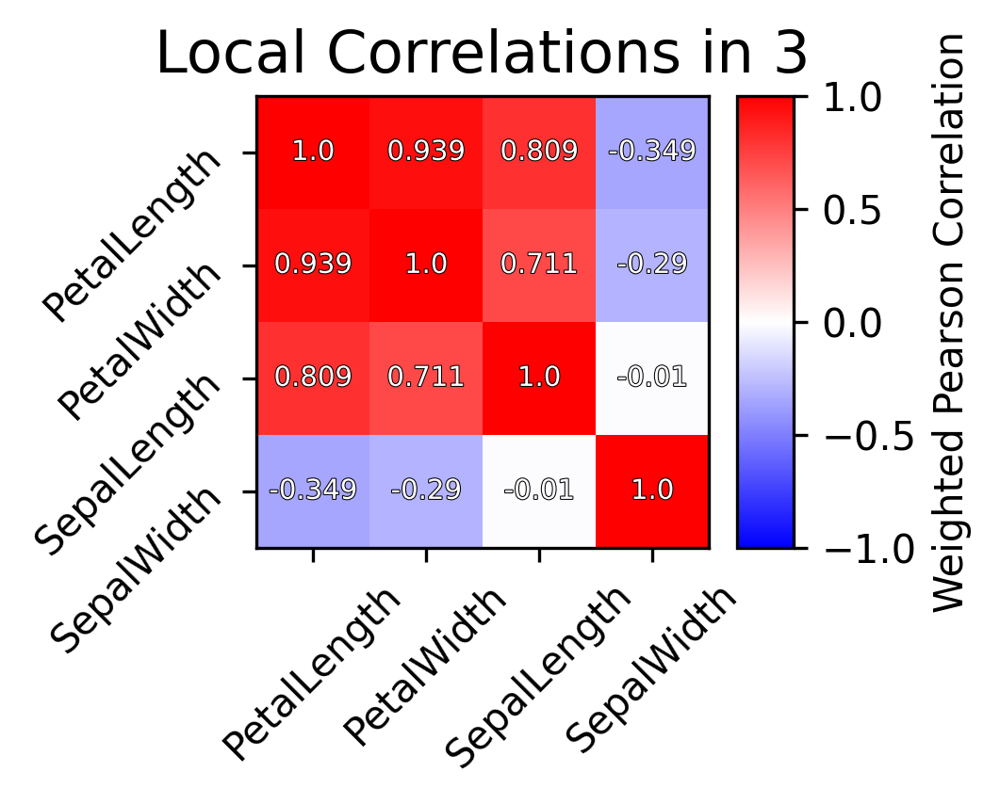

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


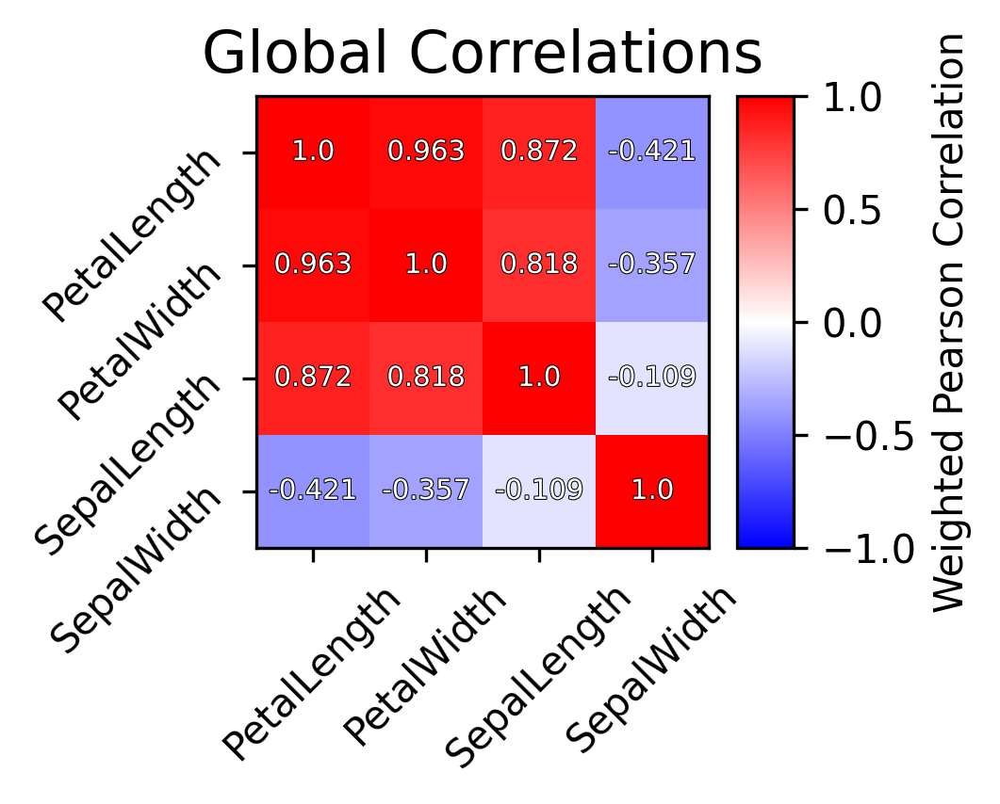

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/3/
Summarizing:4
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[ 9.0384711  12.38642886 49.50969024  8.39981774],A:[ 34.0428097   14.05463191 200.10471189  35.14048792]
Error ratio: [0.28646308 0.88919005 0.25116115 0.26009106]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


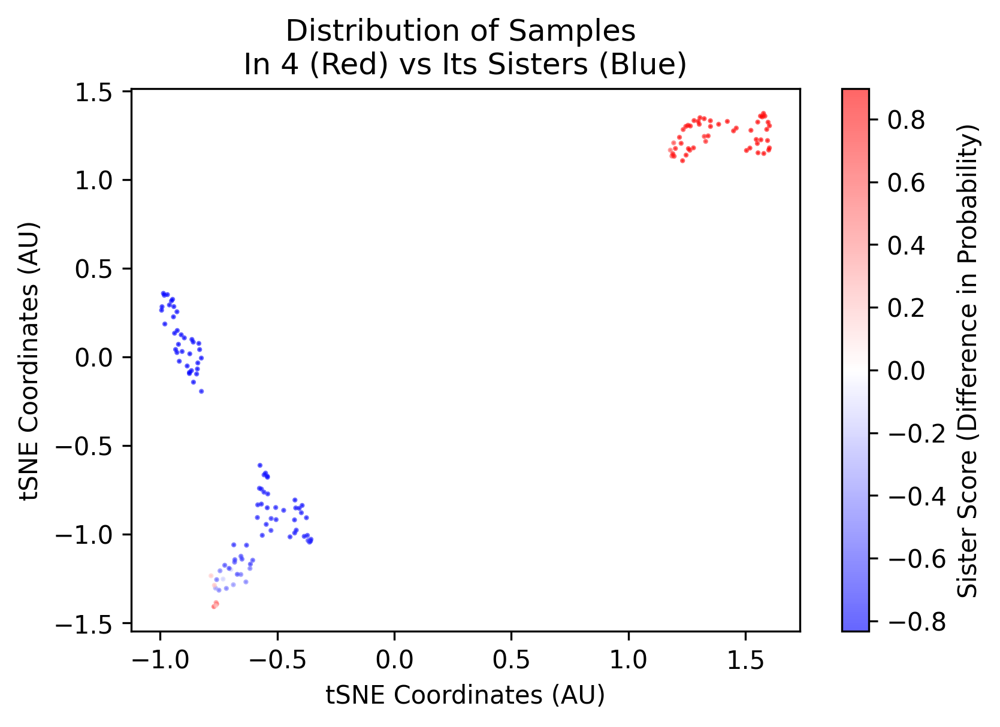

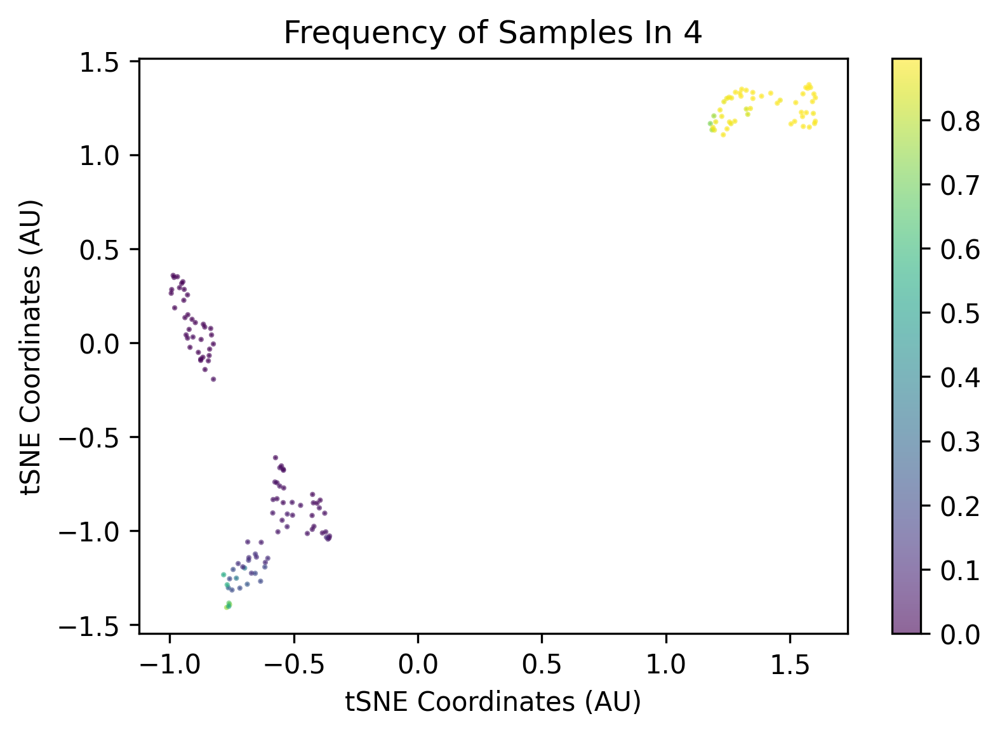

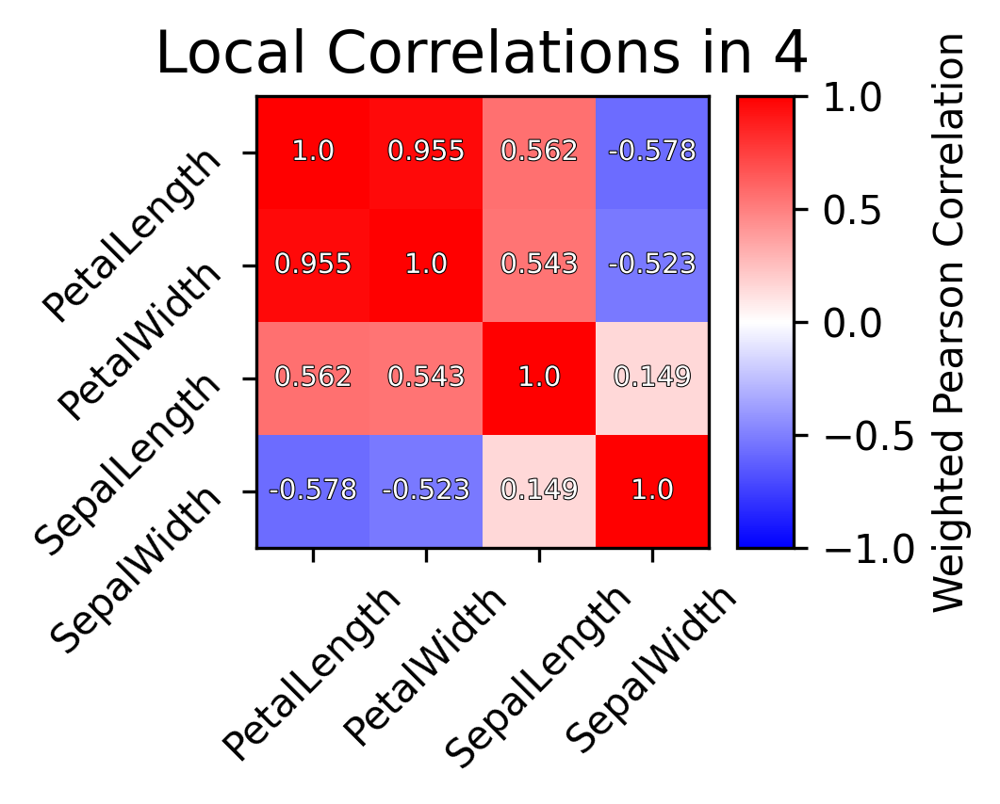

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


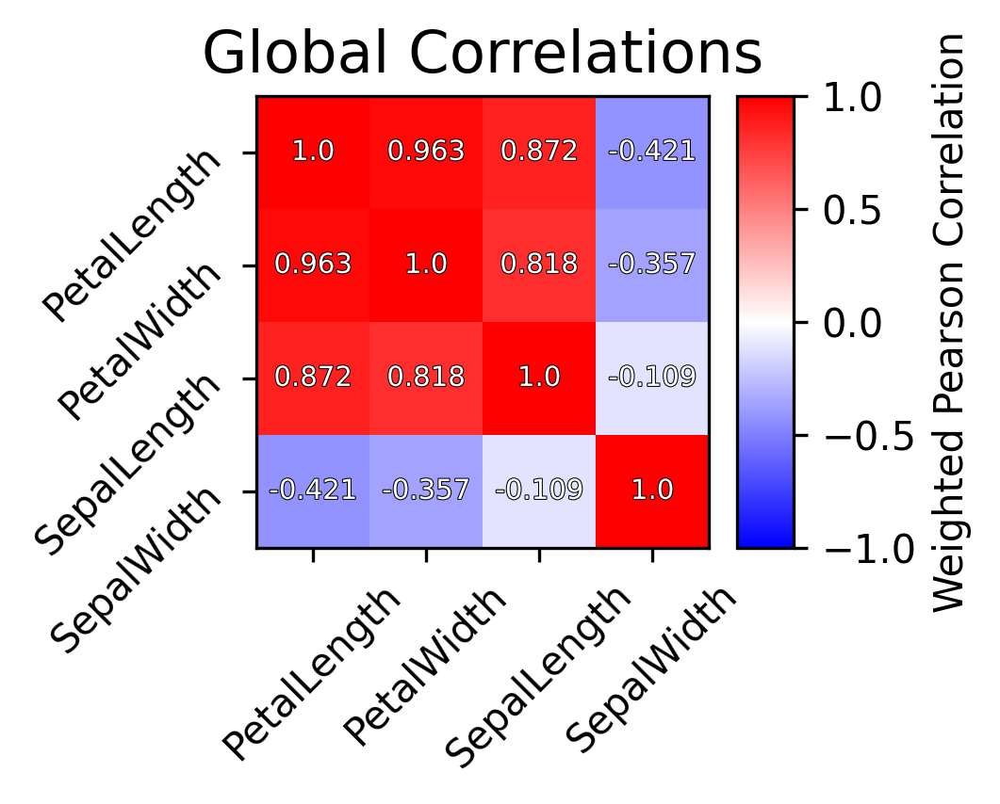

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/4/
Summarizing:5
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[30.73957073  8.49772869 56.68010285 14.40930179],A:[ 53.81892203  10.50847951 200.55969654  39.76303501]
Error ratio: [0.57898933 0.82528093 0.28616883 0.37802145]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


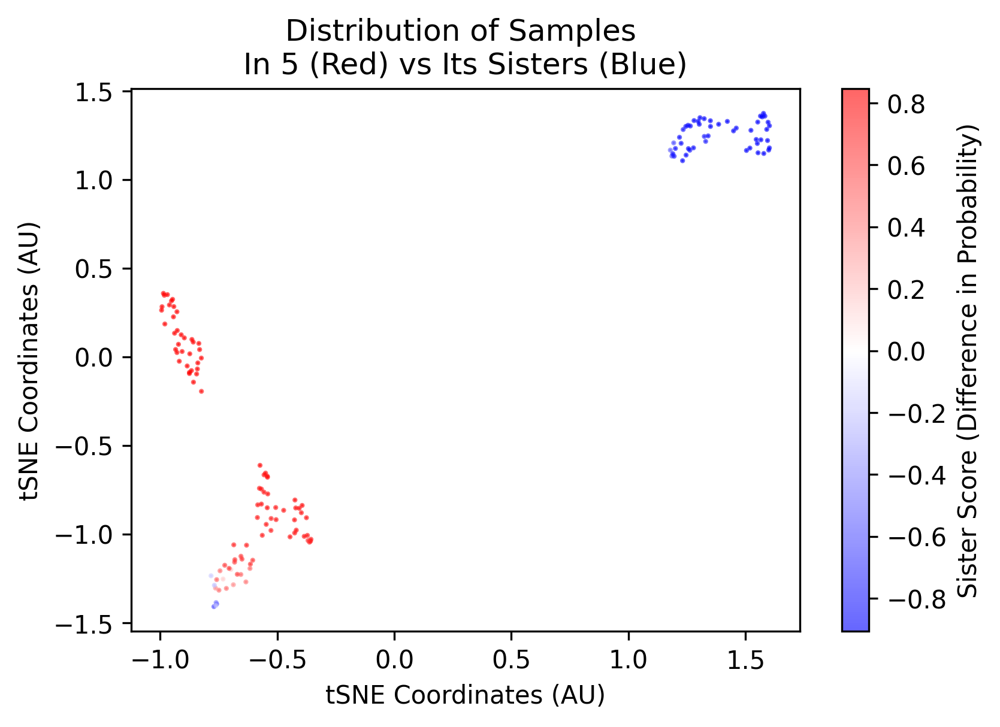

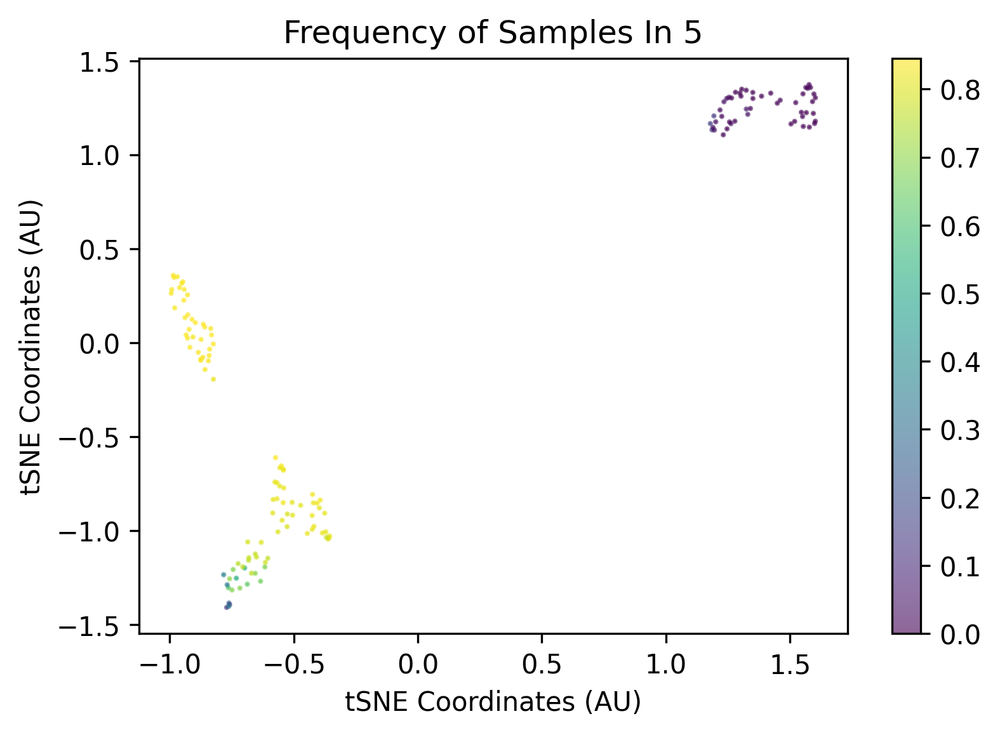

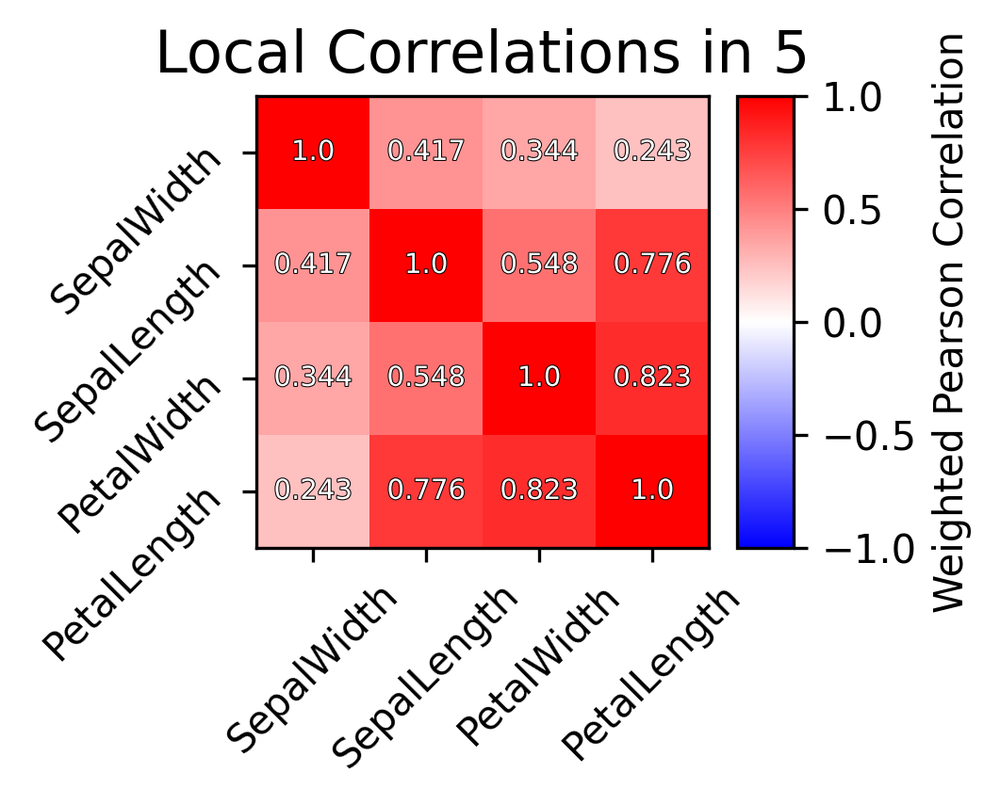

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


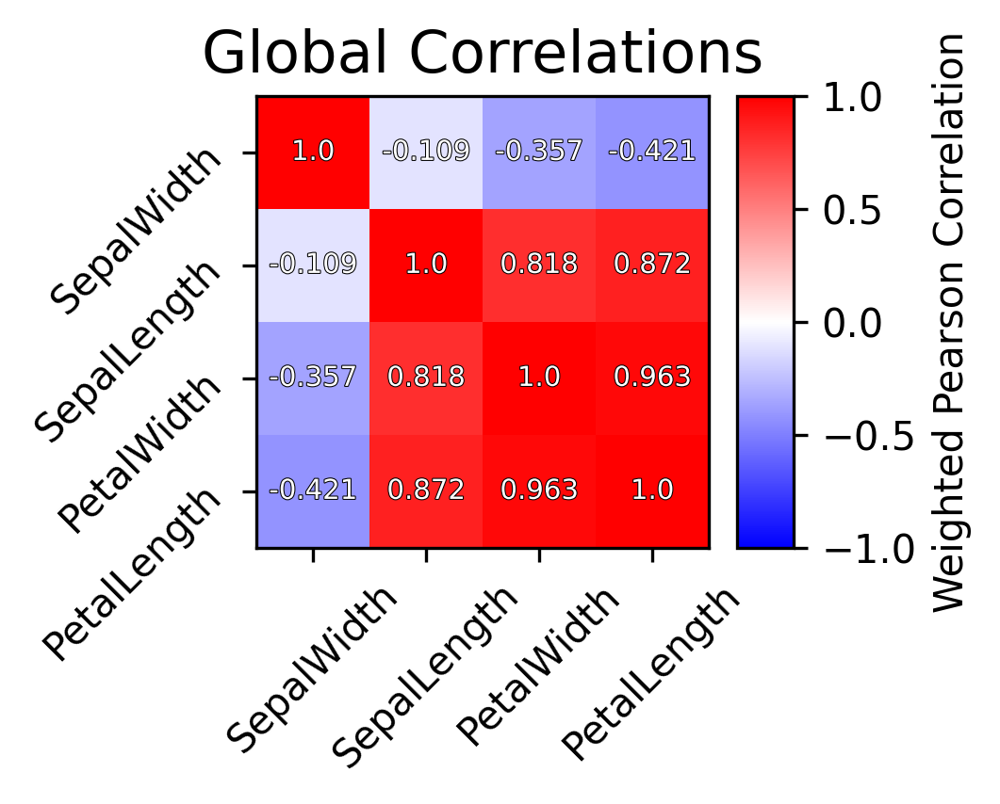

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/5/
Summarizing:6
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[ 9.80241769  2.28736697 27.36057032  5.12614042],A:[12.85577473  2.35223607 31.67283341  5.49909973]
Error ratio: [0.77963289 0.98064901 0.86801686 0.9426137 ]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


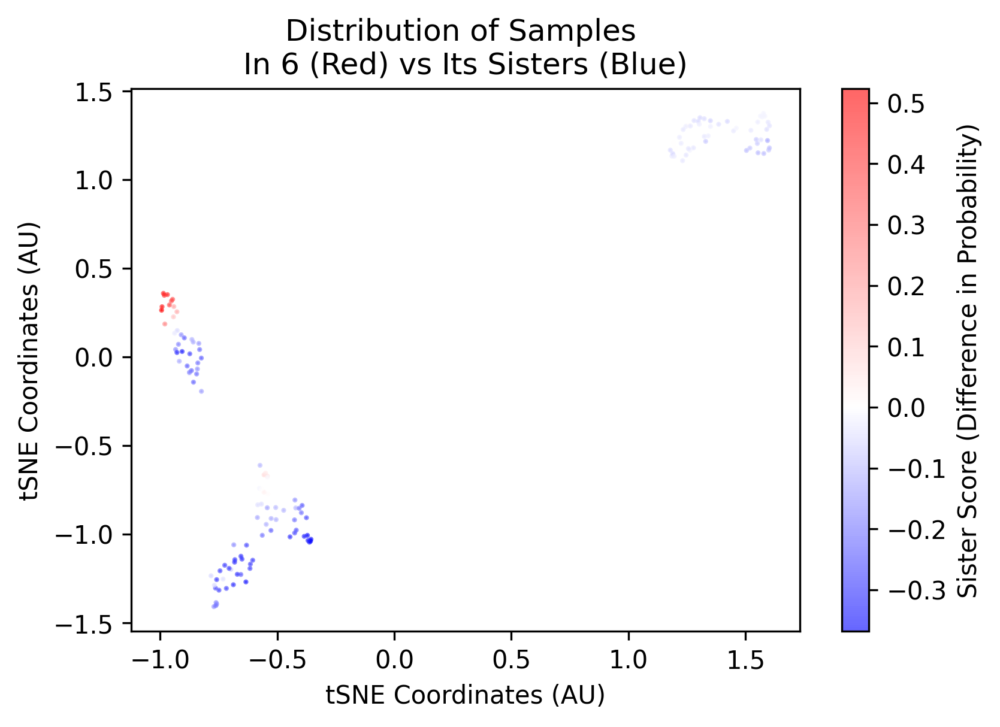

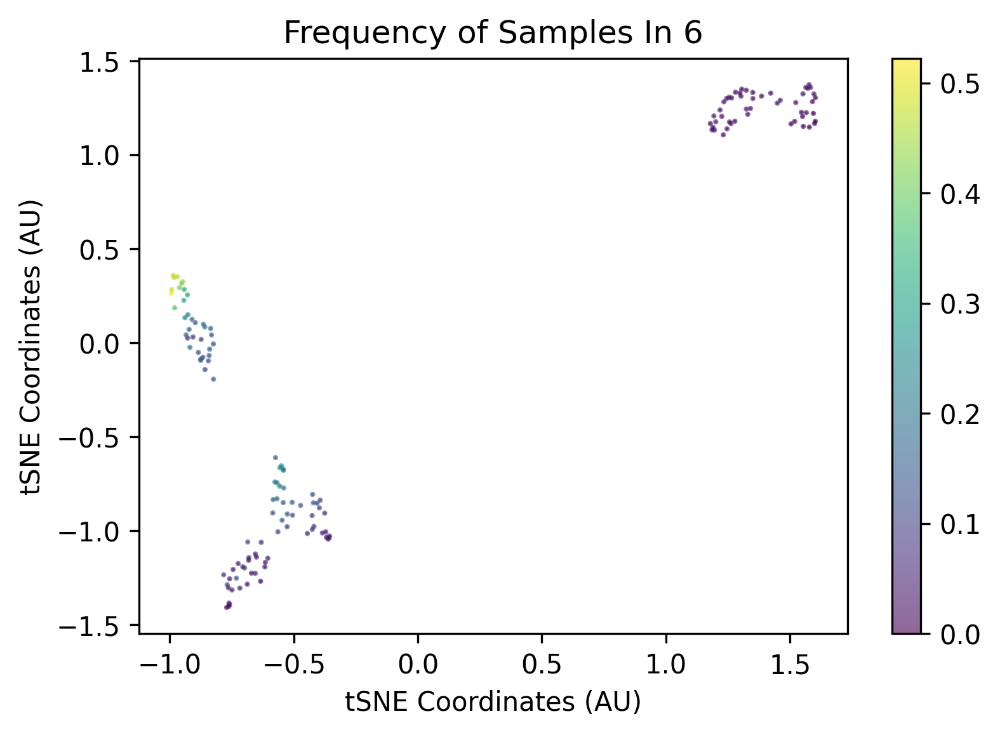

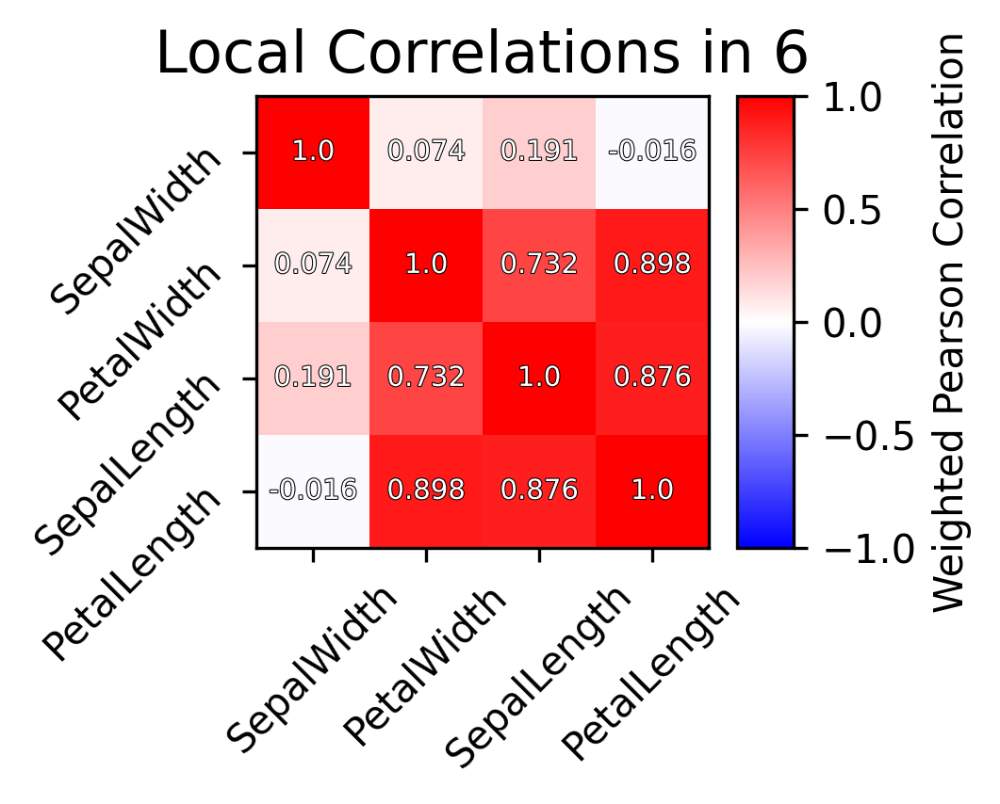

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


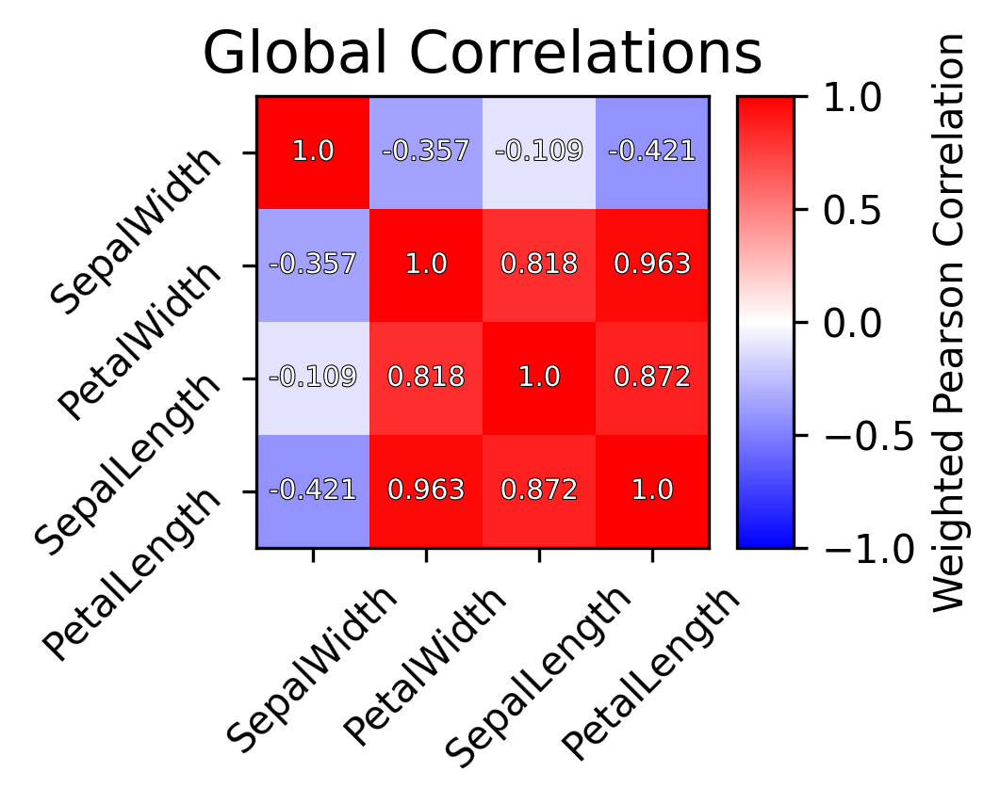

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/6/
Summarizing:7
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[ 23.55163902   4.81603132 110.38462771  19.68690838],A:[ 22.02974264   6.92638734 110.94581422  19.59058188]
Error ratio: [1.06608395 0.73375563 0.99498698 1.00467818]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


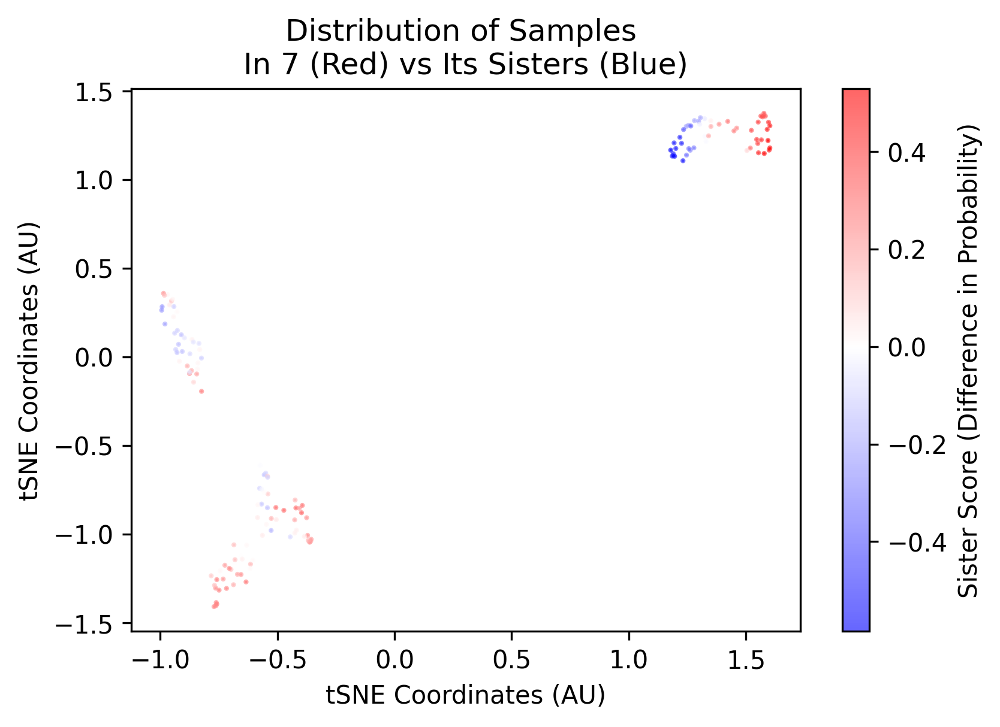

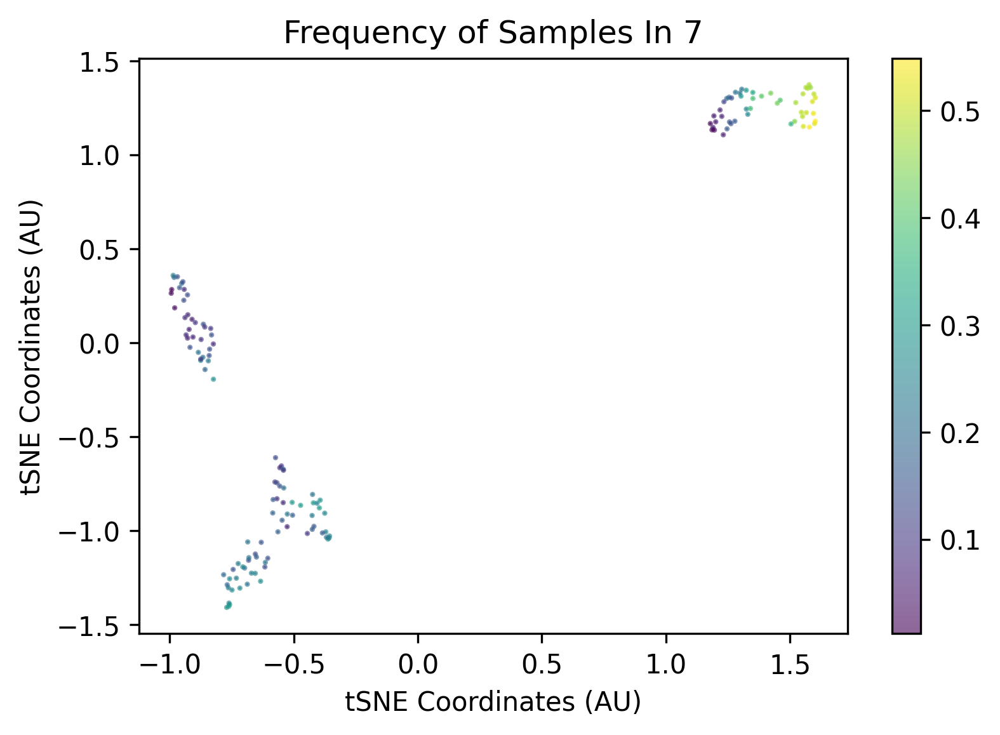

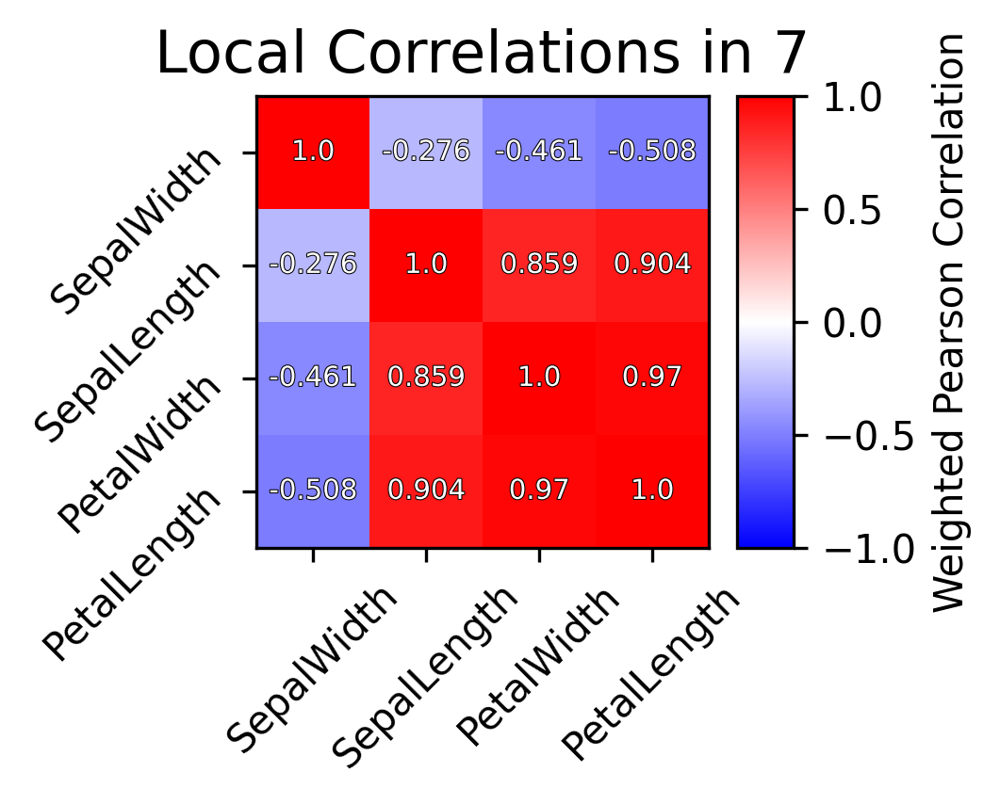

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


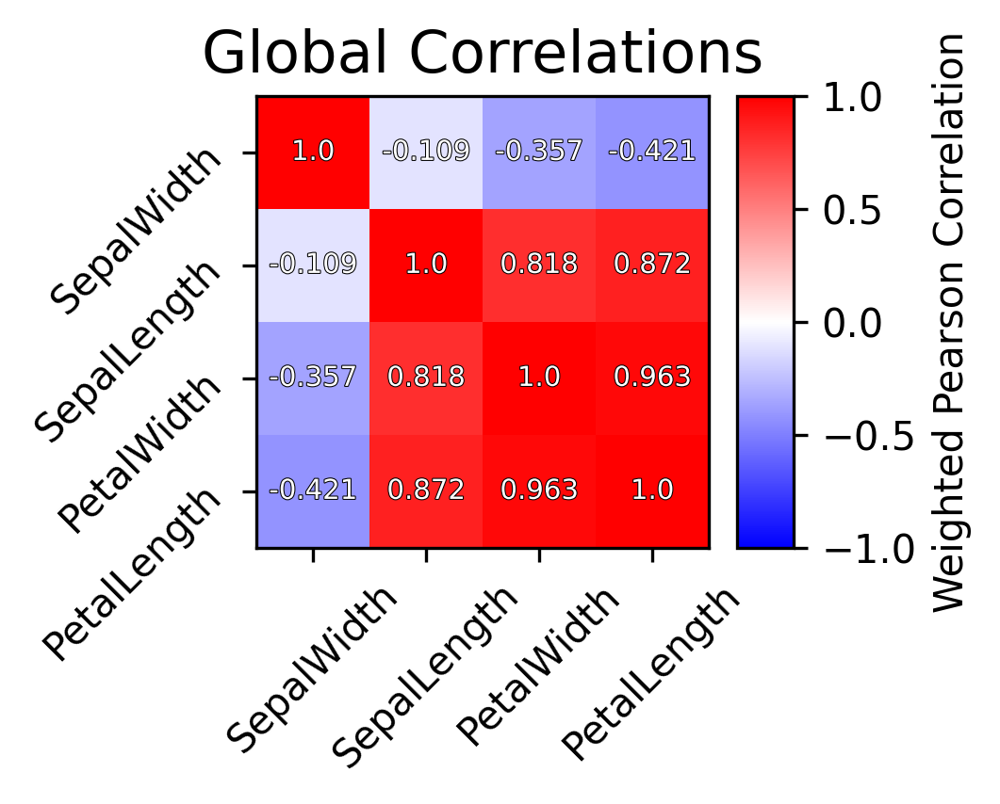

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/7/
Summarizing:8
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[4.21785948 4.68729418 4.84827082 1.00715252],A:[ 4.8265836   6.08490909 17.65676545  3.06477893]
Error ratio: [0.89552641 0.80273354 0.31346649 0.49379131]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


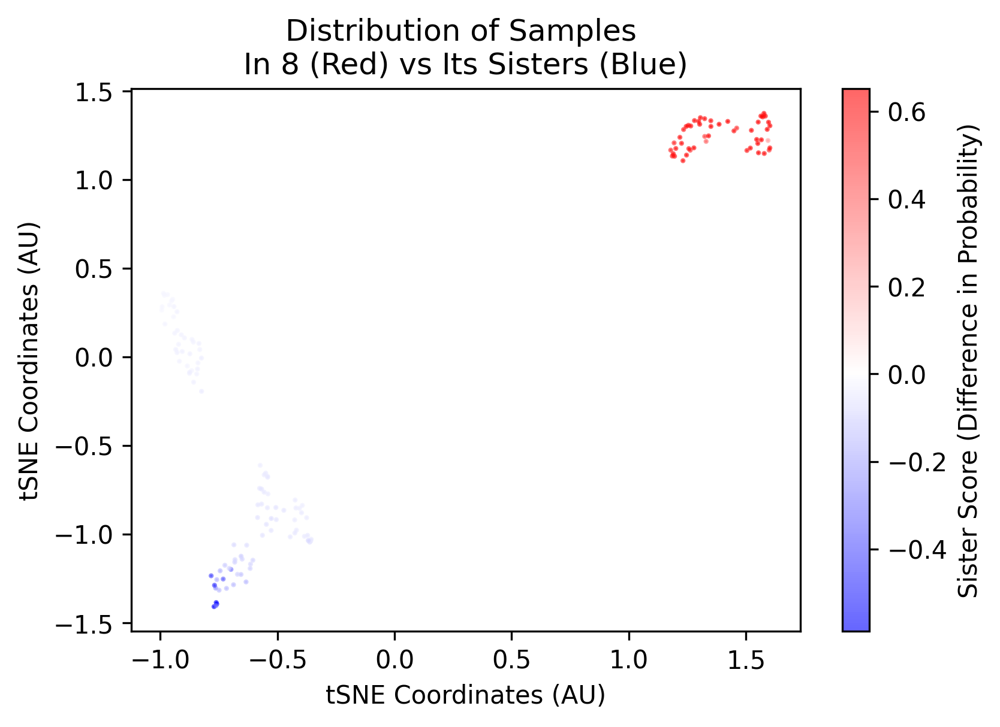

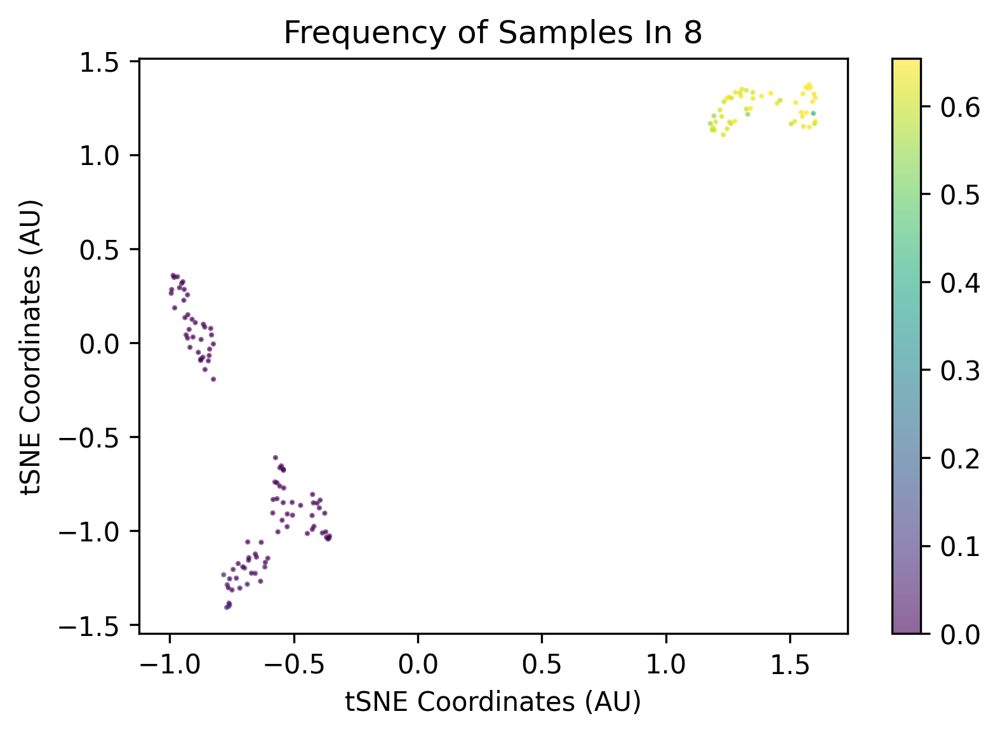

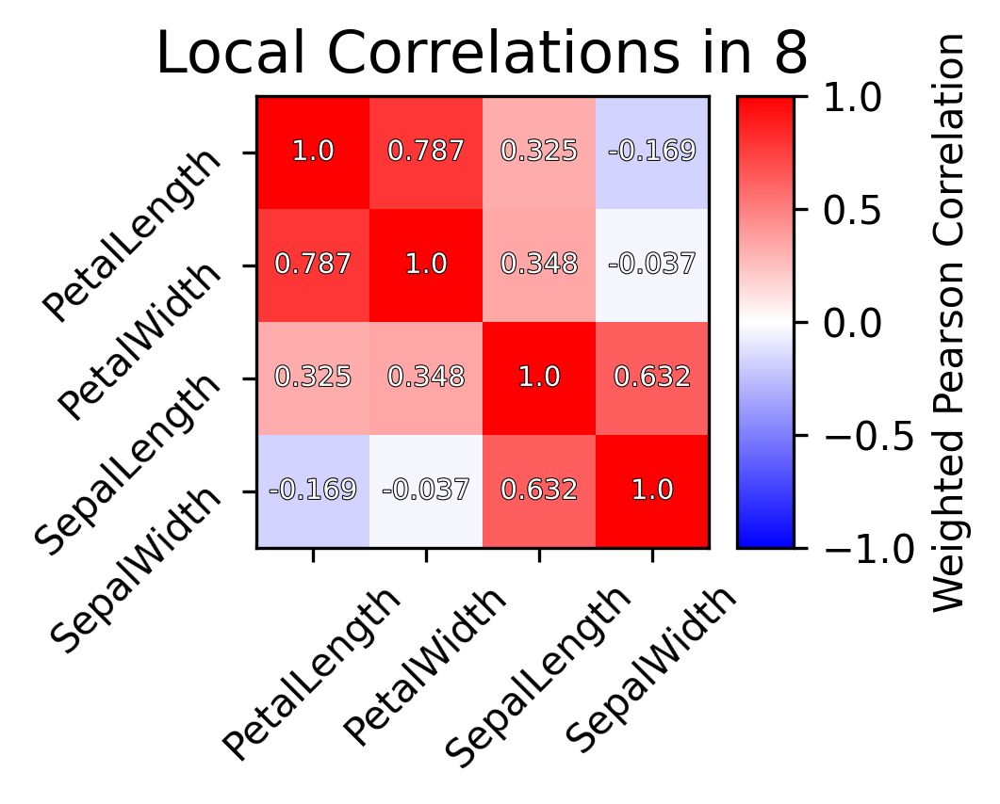

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


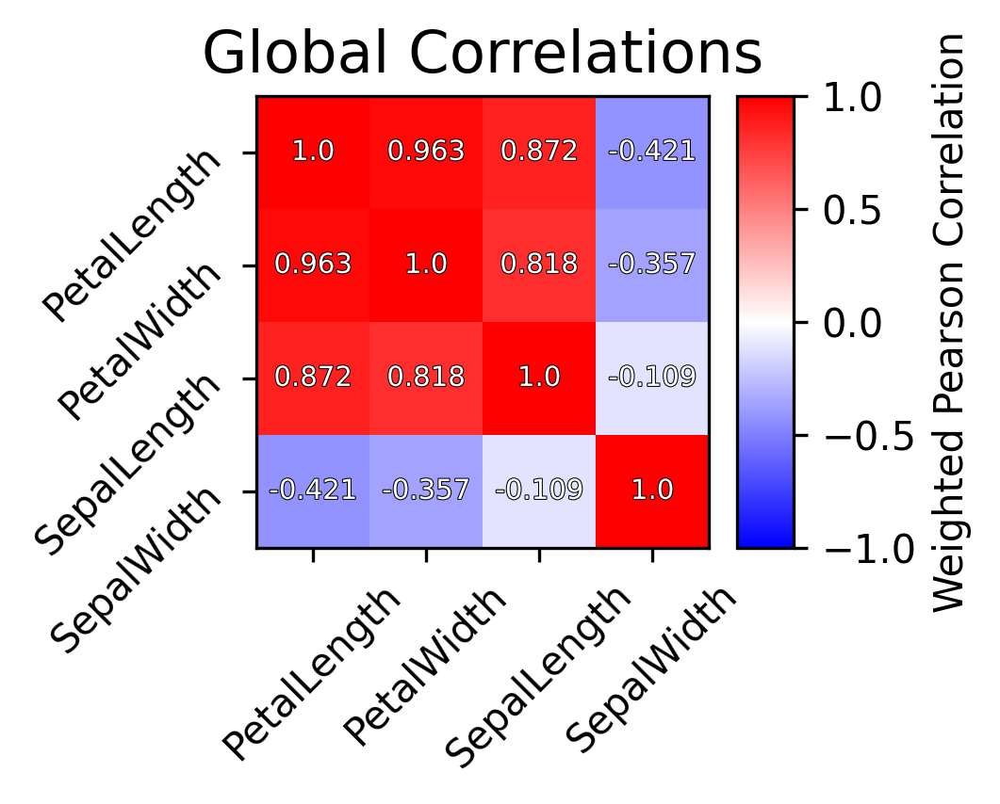

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/8/
Summarizing:9
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[ 5.57843084  1.82316566 15.4041098   2.94098384],A:[ 6.77839683  4.3320237  45.2112614   7.83924741]
Error ratio: [0.84573094 0.52947358 0.35498078 0.44585061]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


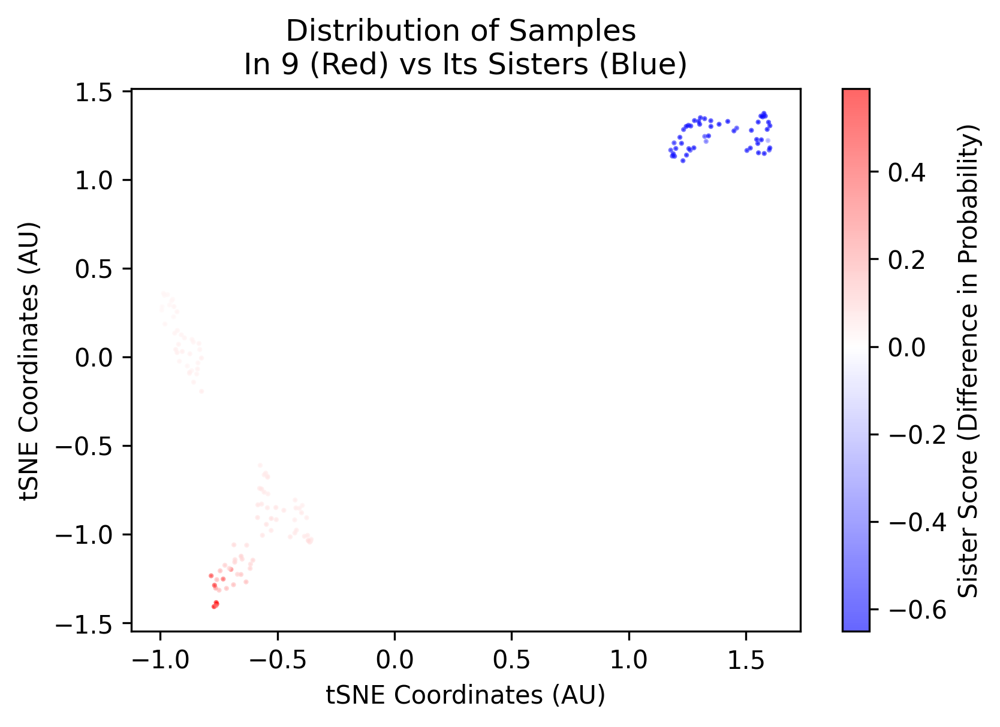

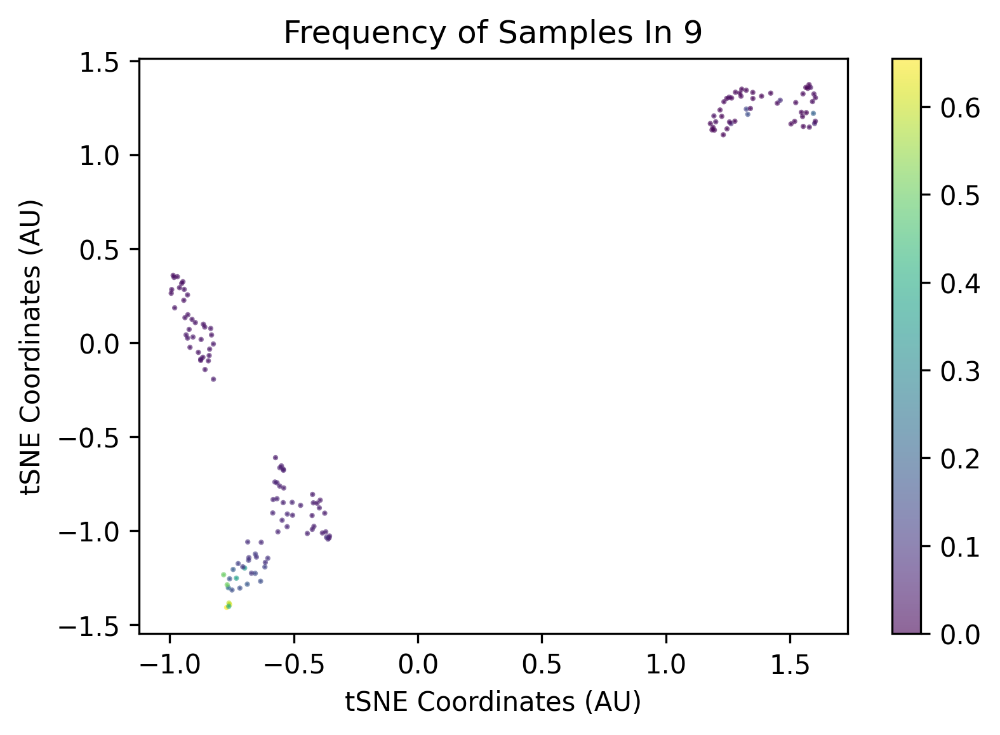

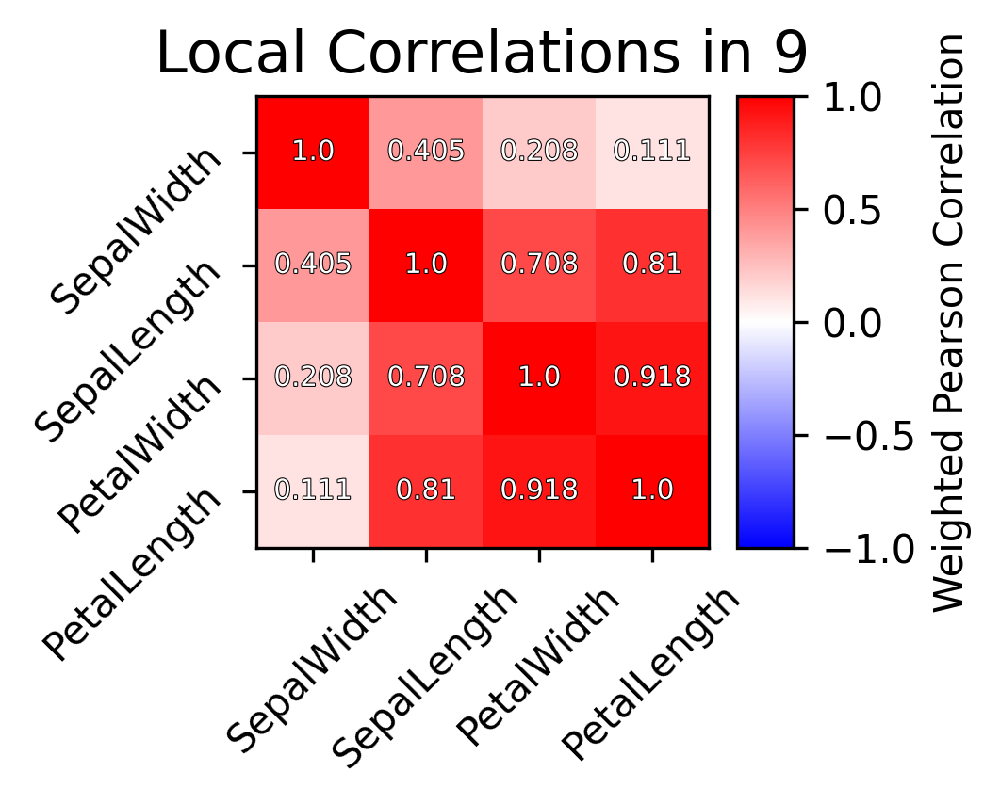

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


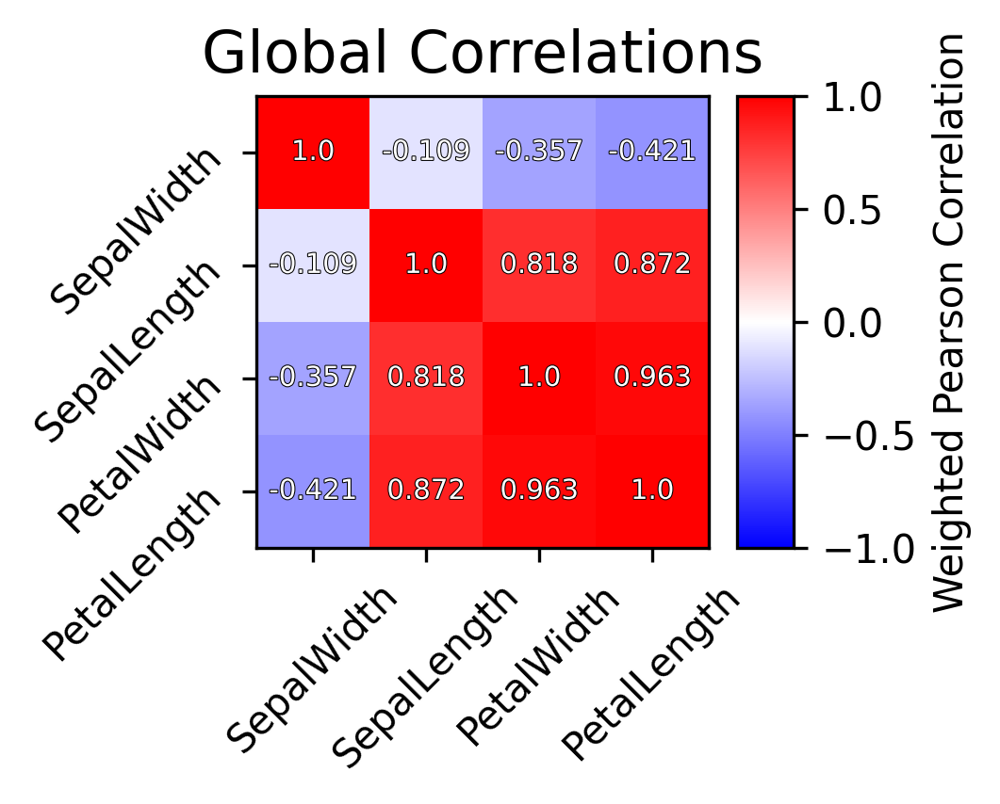

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/9/
Summarizing:10
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[12.85735875  3.69993491 50.00759194 11.66286901],A:[13.72655886  3.71691923 50.42672235 11.6614499 ]
Error ratio: [0.94097738 0.99639928 0.99184995 1.00011208]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


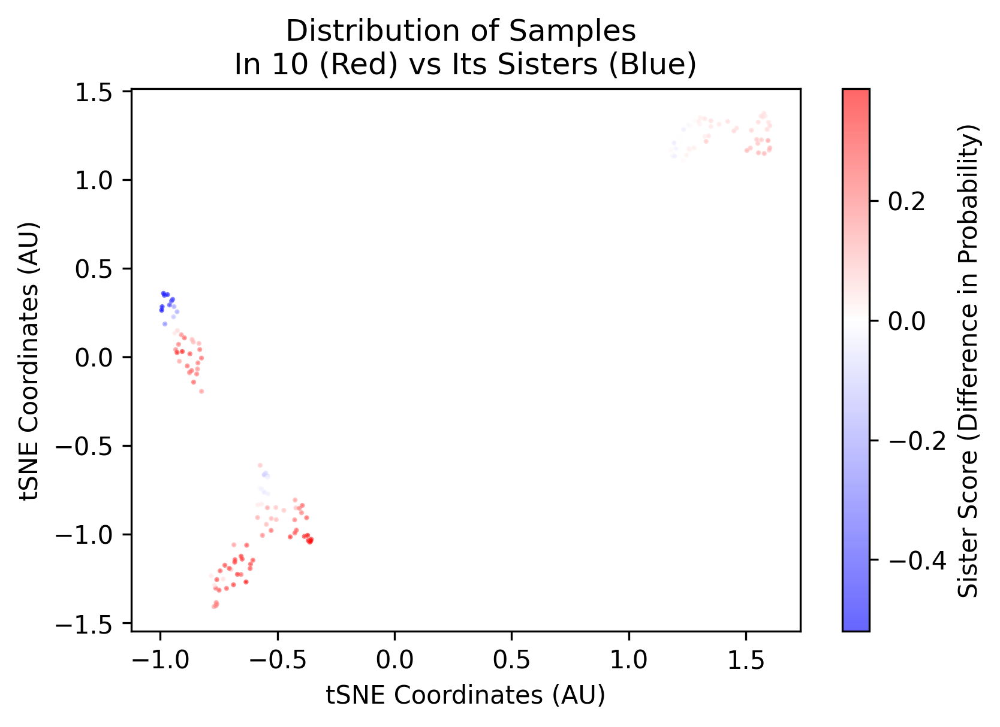

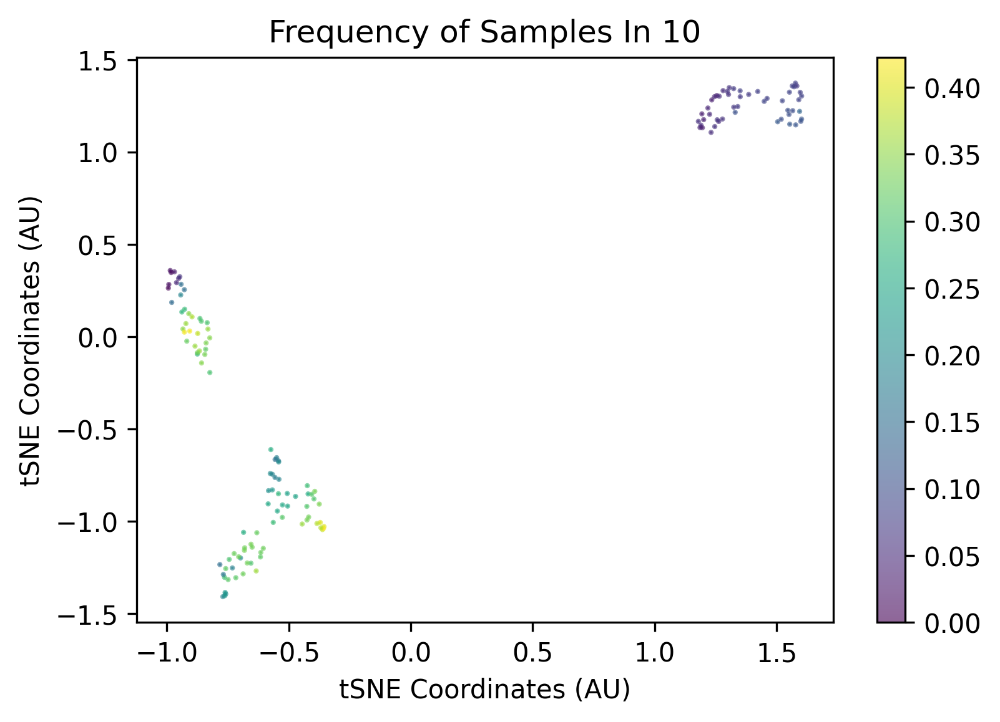

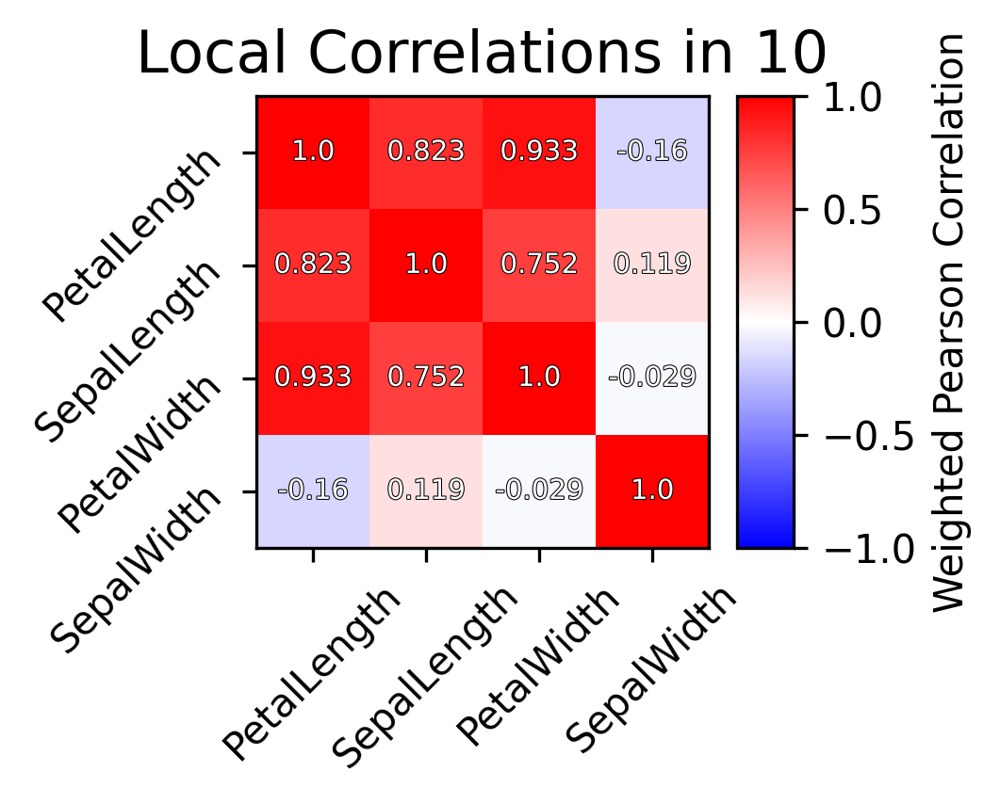

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


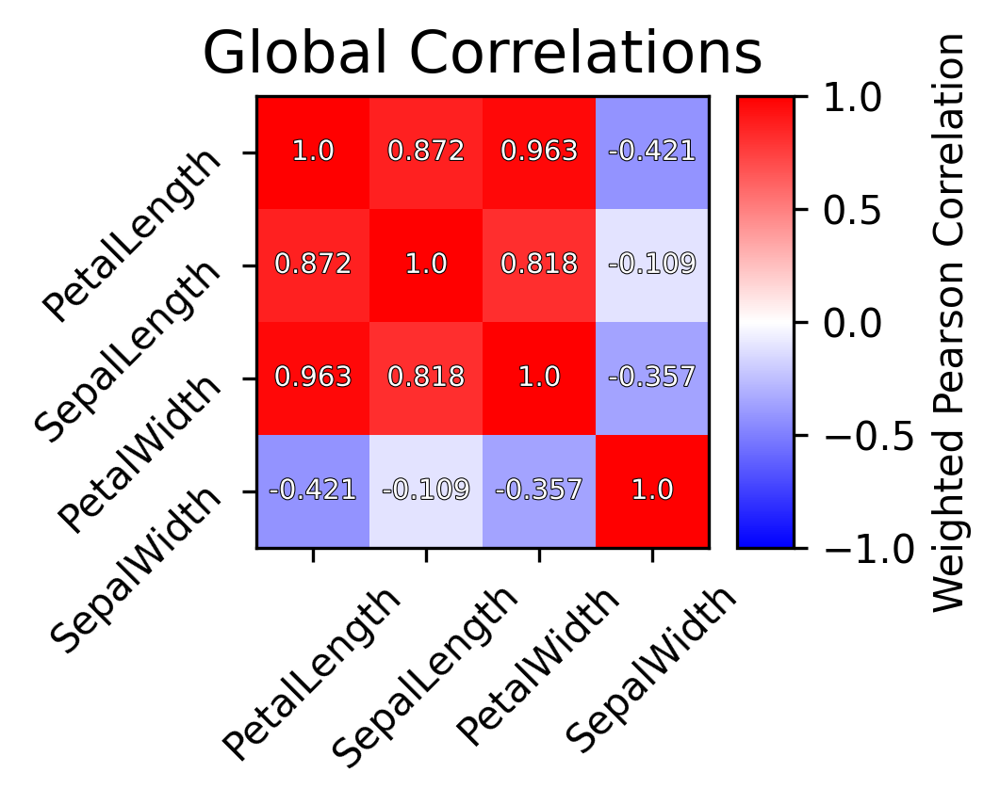

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/10/
Summarizing:11
Rendering scores


/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/boris/miniconda3/lib/python3.8/site-packages/sklearn/preprocessing/

Error: P:[11.24737348  4.37253933 49.77310335  8.34984061],A:[11.30895927  4.36756143 50.47417227  8.74192994]
Error ratio: [0.99499667 1.0009274  0.98638018 0.9597524 ]
Generating top local


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


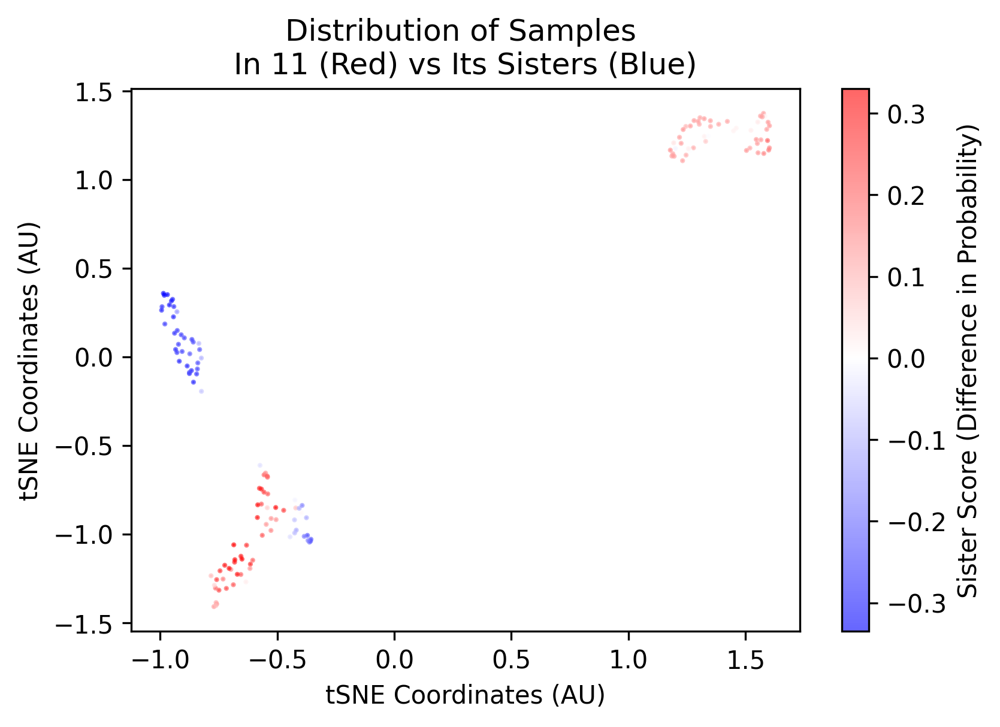

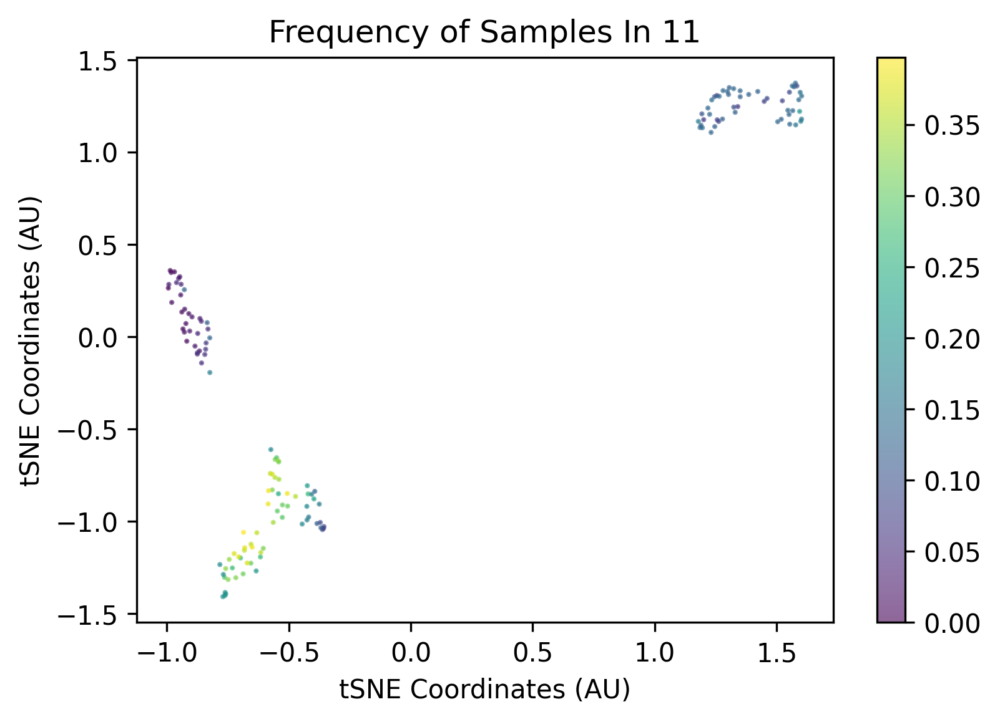

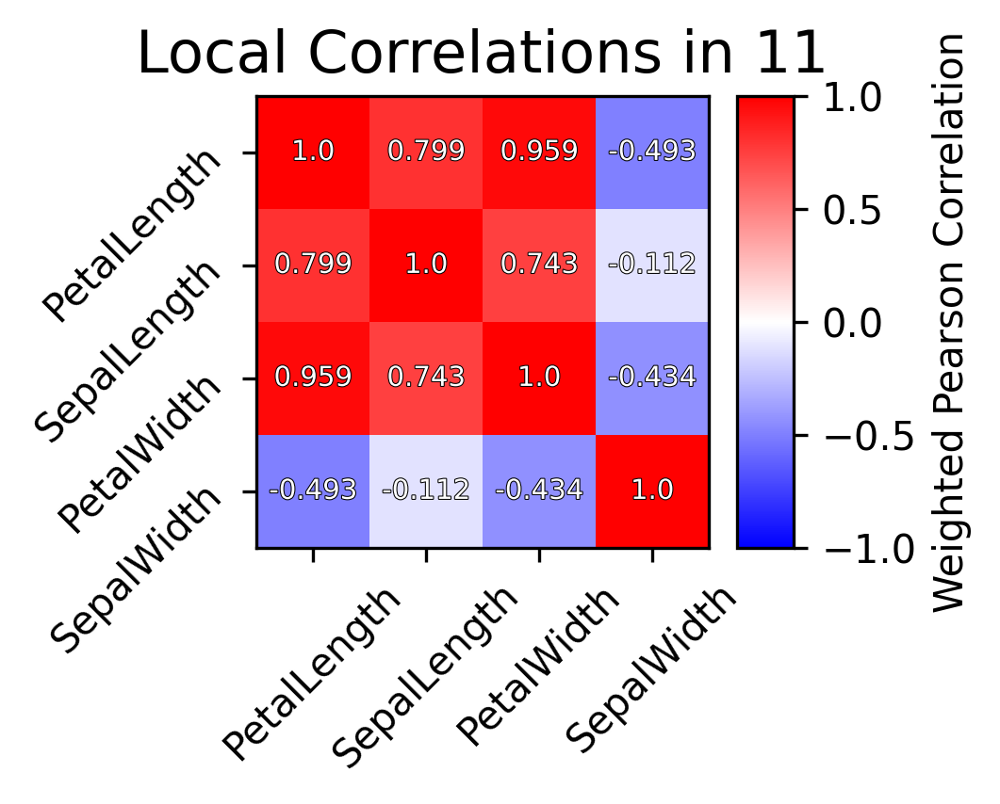

Generating top global


/home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


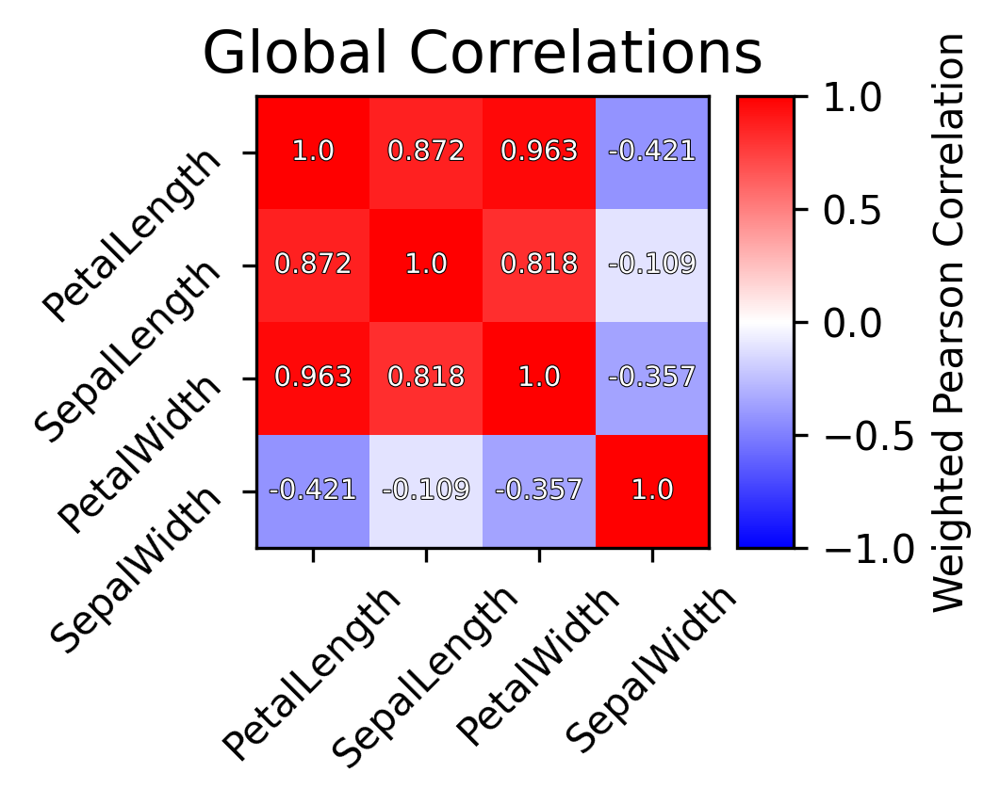

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/11/


/home/boris/miniconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/boris/miniconda3/lib/python3.8/site-packages/numpy/core/_methods.py:180: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


Error: P:[101.96440452  27.95668663 462.93785762  86.60652029],A:[nan nan nan nan]
Error ratio: [nan nan nan nan]
Generating top local


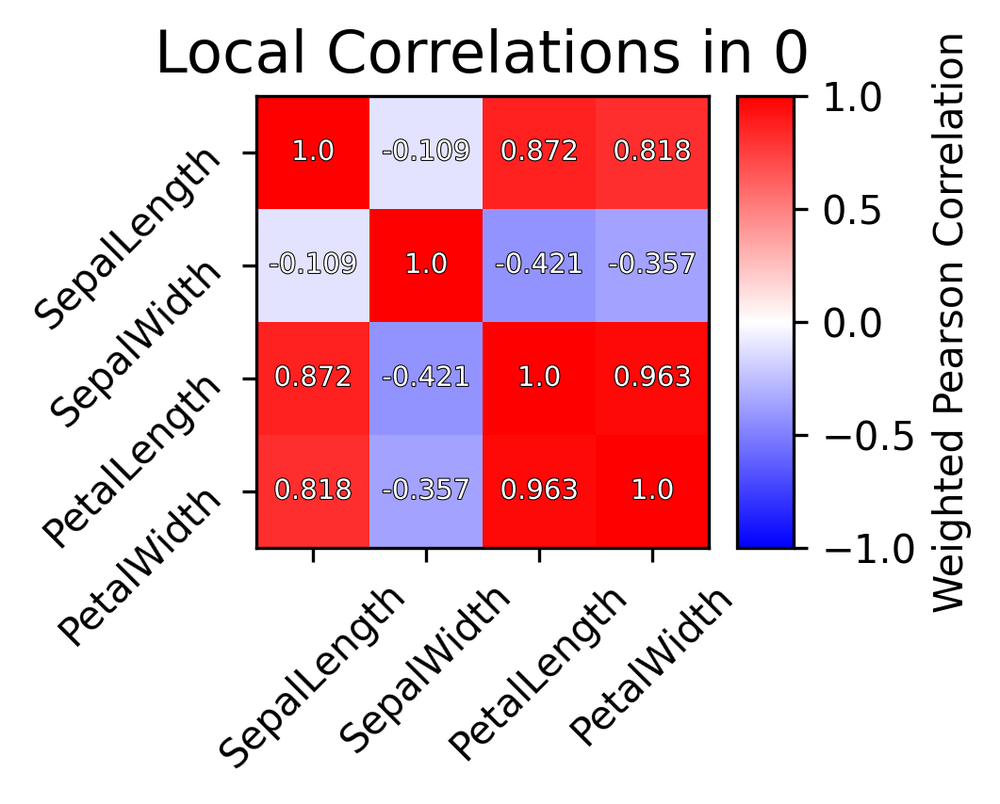

Generating top global


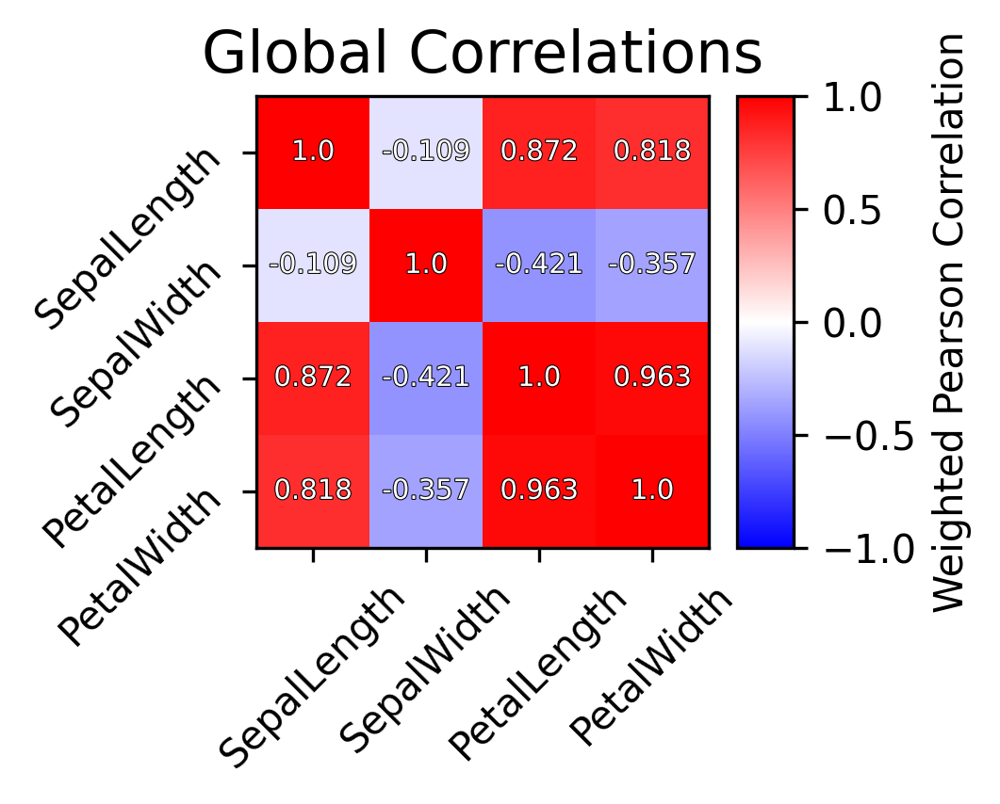

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/0/
Error: P:[16.82366106  4.71902235 95.20809868 17.76485056],A:[19.10709579  4.98053576 95.35077099 18.06778299]
Error ratio: [0.88643637 0.95627258 0.99851924 0.98411287]
Generating top local


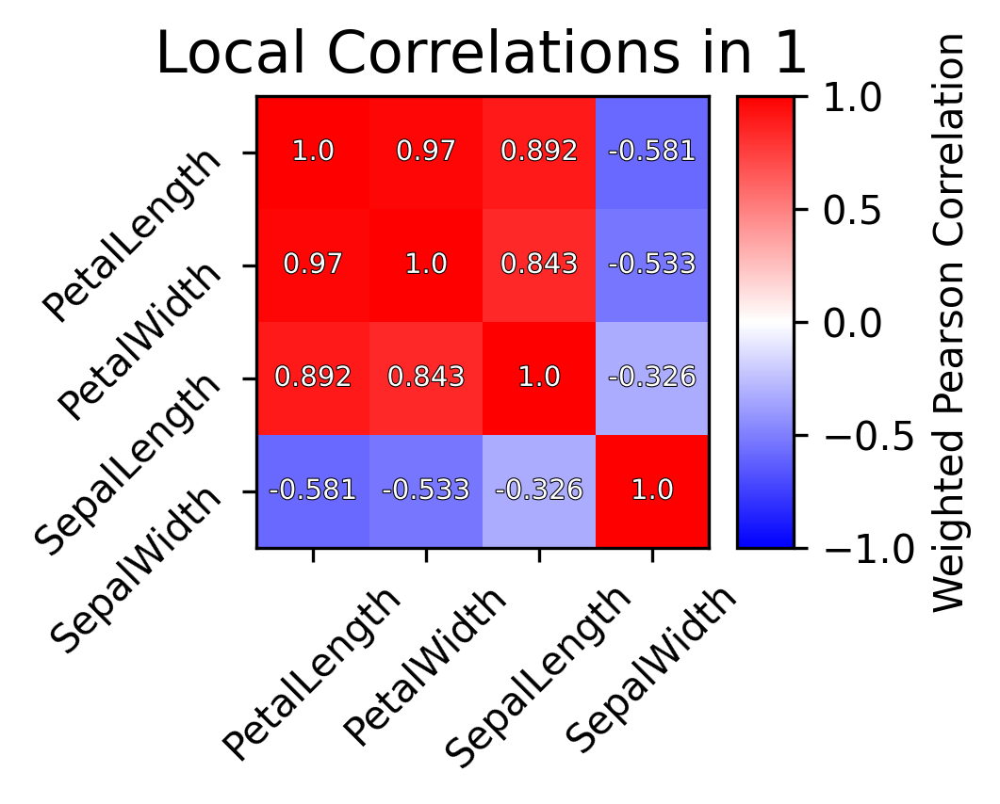

Generating top global


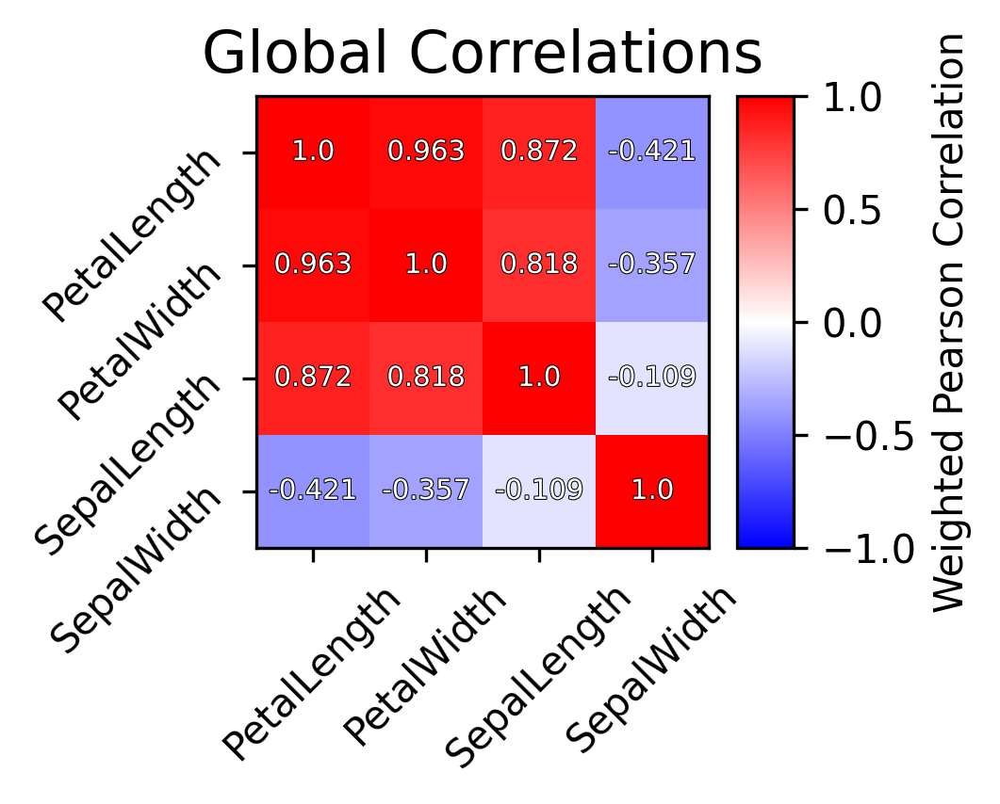

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/1/
Error: P:[12.1082824   2.86078578 28.57879892  6.16033721],A:[15.71782107  2.86903049 45.51919096 10.67368125]
Error ratio: [0.78409036 0.99786905 0.63584079 0.6133744 ]
Generating top local


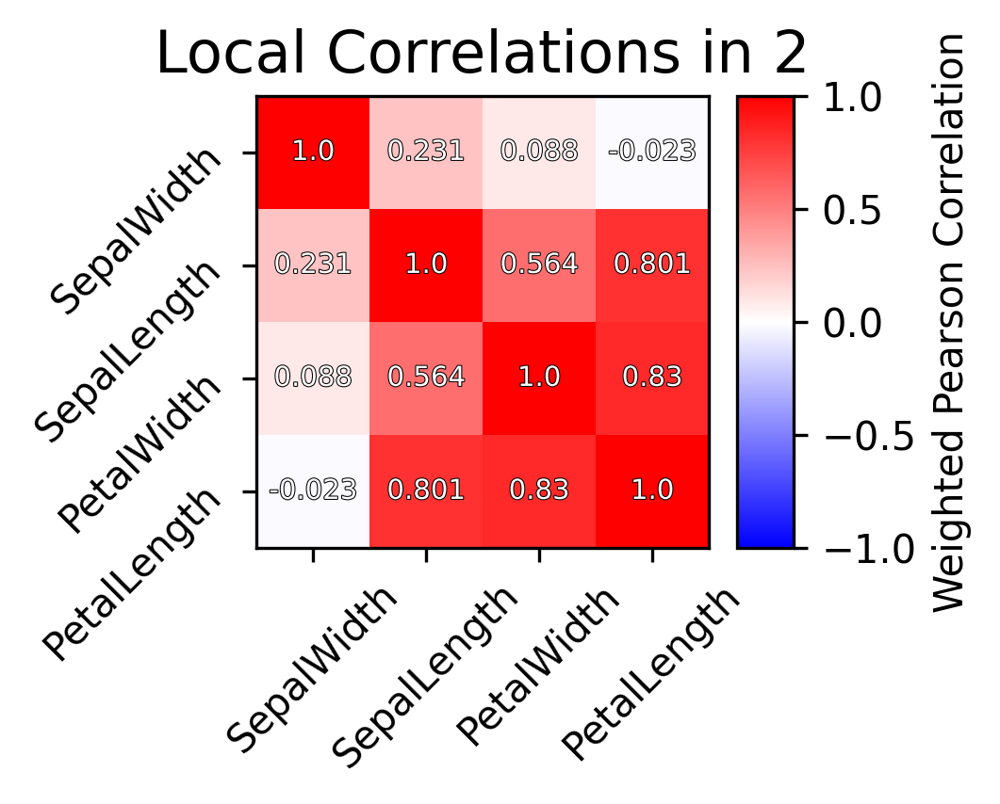

Generating top global


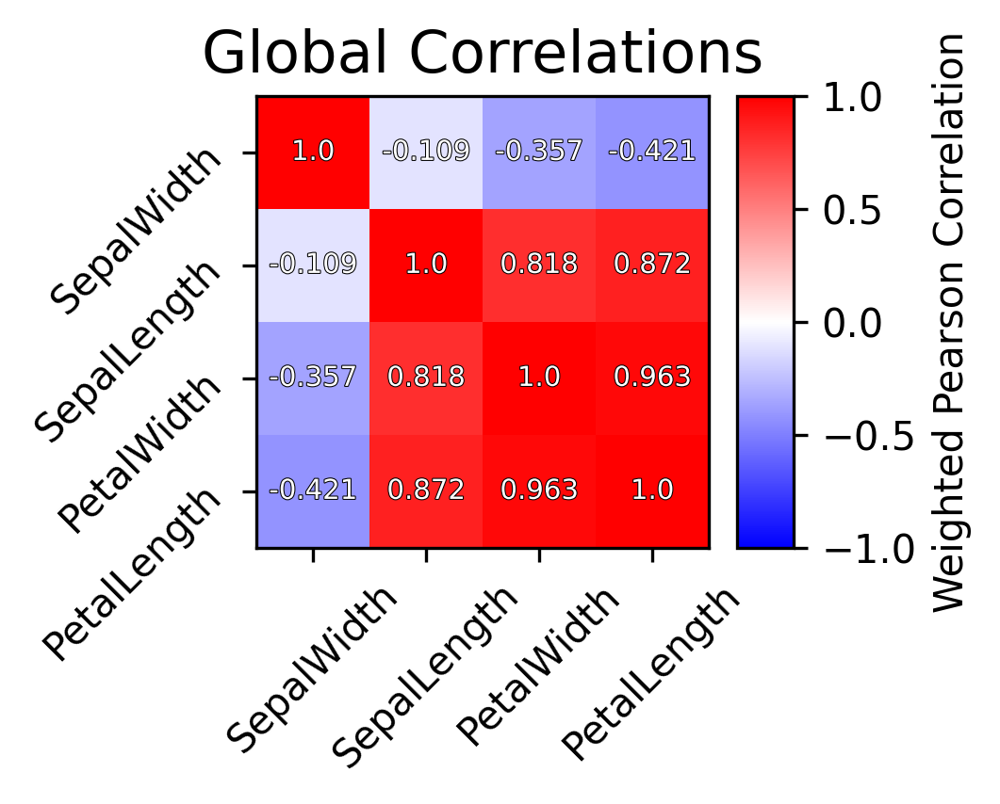

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/2/
Error: P:[17.04915366  4.75968381 62.11847623 11.26445377],A:[18.10705858  5.21016478 64.01445155 12.13168216]
Error ratio: [0.94463277 0.92746071 0.97083763 0.93395908]
Generating top local


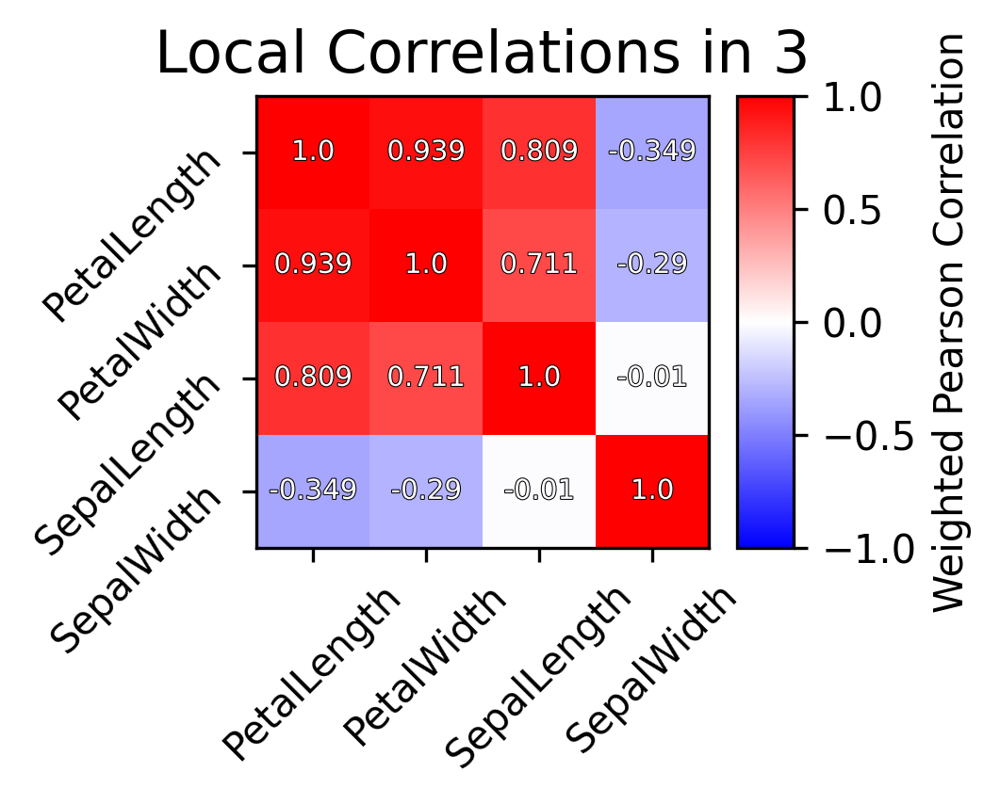

Generating top global


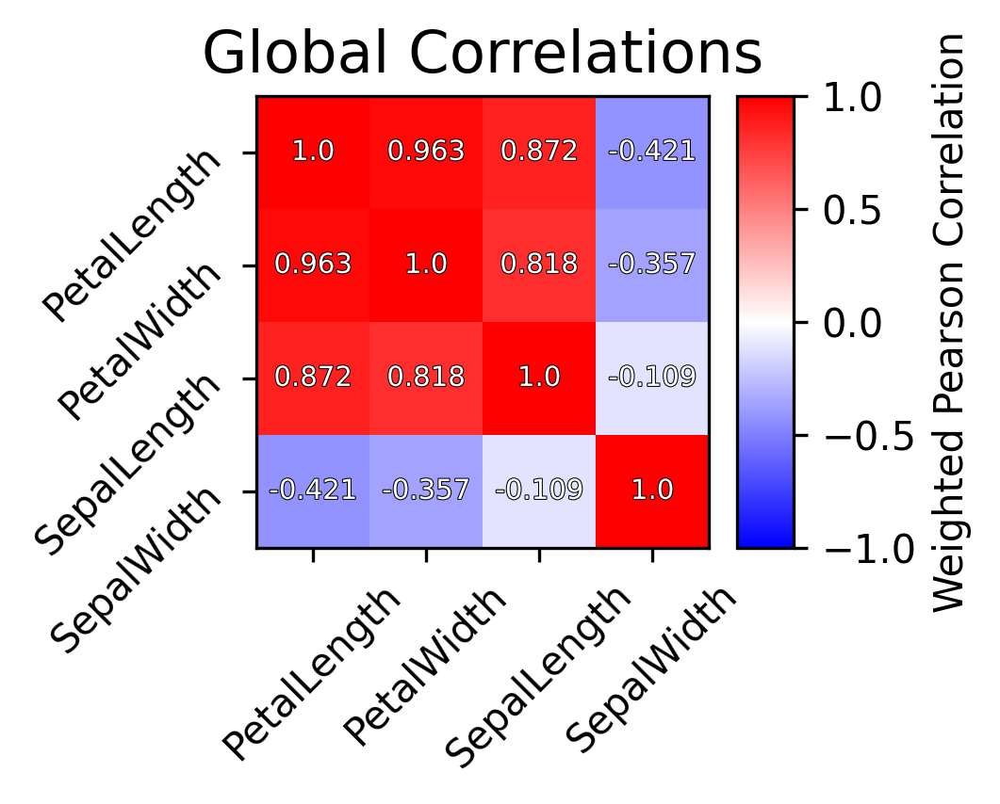

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/3/
Error: P:[ 9.0384711  12.38642886 49.50969024  8.39981774],A:[ 34.0428097   14.05463191 200.10471189  35.14048792]
Error ratio: [0.28646308 0.88919005 0.25116115 0.26009106]
Generating top local


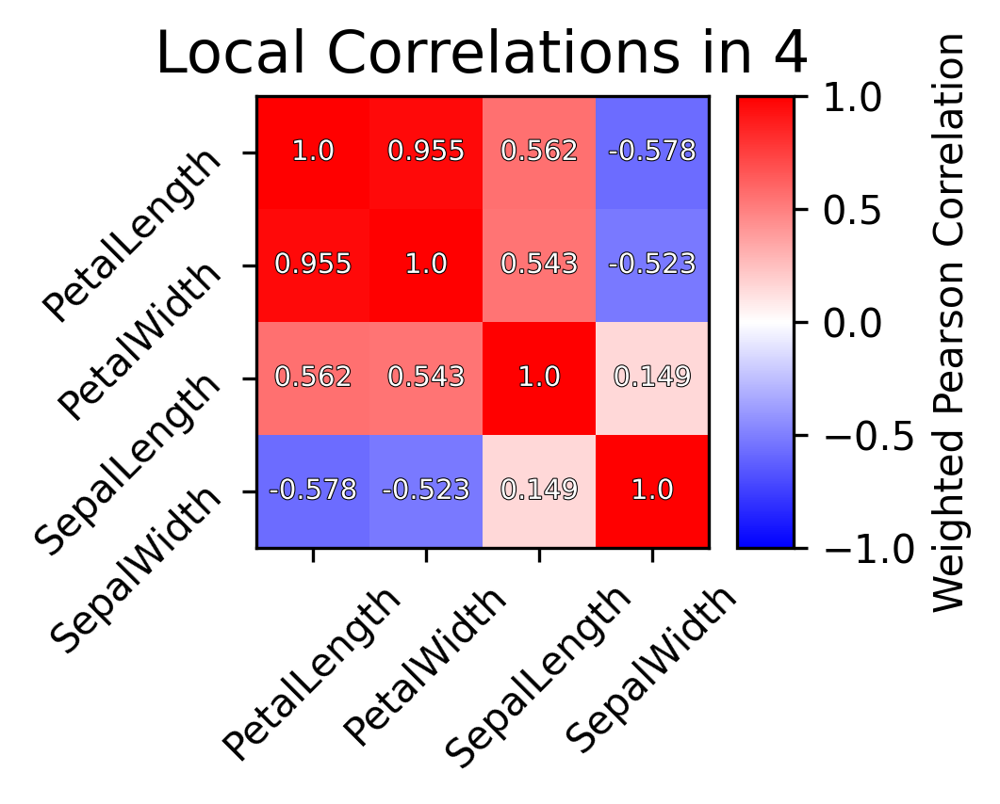

Generating top global


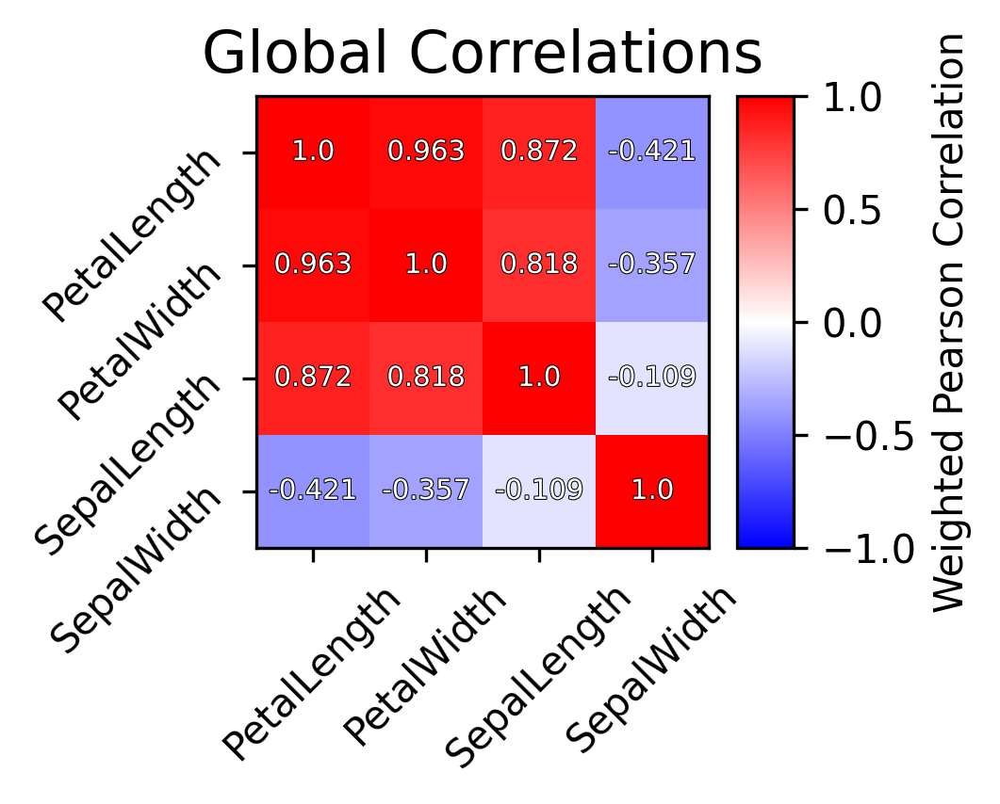

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/4/
Error: P:[30.73957073  8.49772869 56.68010285 14.40930179],A:[ 53.81892203  10.50847951 200.55969654  39.76303501]
Error ratio: [0.57898933 0.82528093 0.28616883 0.37802145]
Generating top local


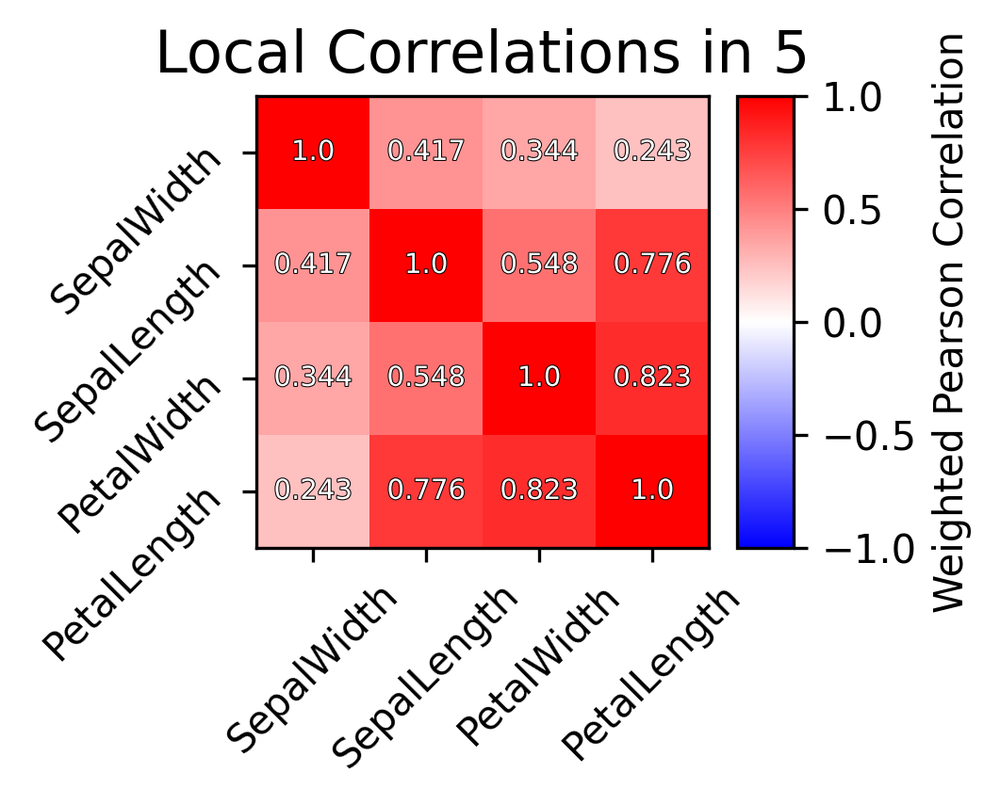

Generating top global


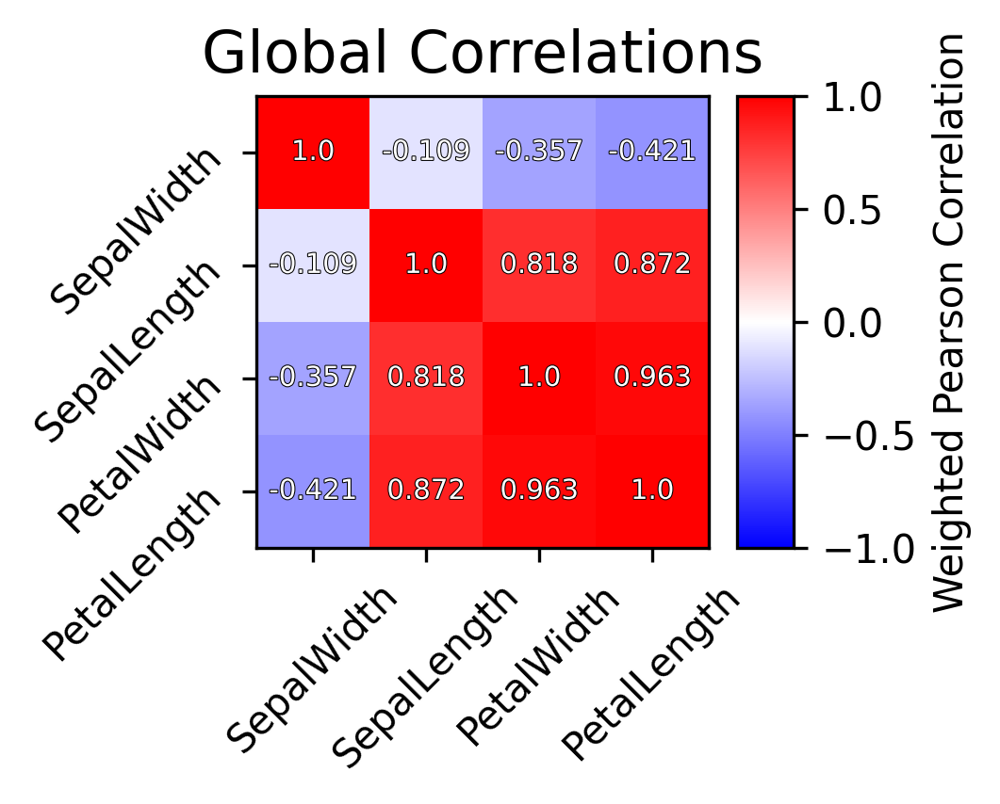

Saving cross ref to /home/boris/miniconda3/lib/python3.8/site-packages/rusty_axe/html/5/
Error: P:[ 9.80241769  2.28736697 27.36057032  5.12614042],A:[12.85577473  2.35223607 31.67283341  5.49909973]
Error ratio: [0.77963289 0.98064901 0.86801686 0.9426137 ]
Generating top local


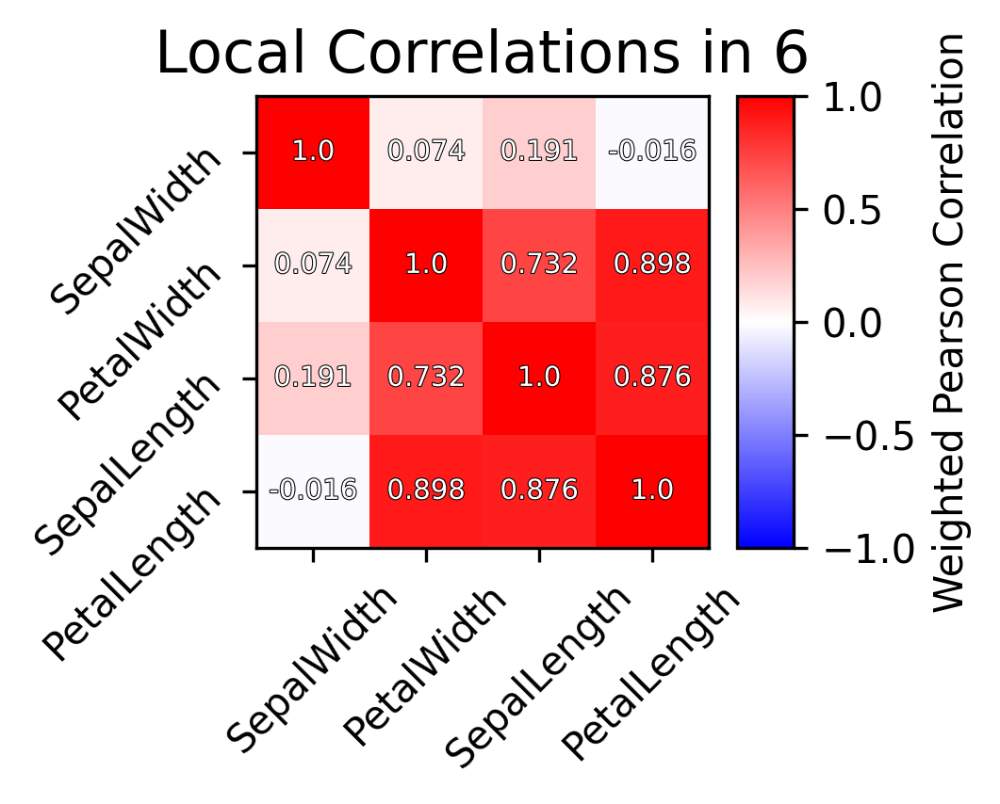

Generating top global


In [ ]:
forest.html_tree_summary(
    
    n=2,
    # This parameter controls how many features are used when summarizing particular nodes. 
    
    output=None
    # If you would like your HTML report to be saved to a particular location, put it here. 
)

What happened here?

We have clustered the nodes of the RFR into groups based on the effects they predict in their children. Each group of nodes is called a "factor" because similarly to factors used in factor analysis, they summarize the behavior of several observed variables that tend to move together in some way. Like other factors, RF factors produce certain "scores" for each sample, reflecting the likelihood that an effect predicted by the factor "applies" to a particular sample.

Factors can also give "sister scores" 

After you've looked at the consensus tree, you may want to start annotating the individual clusters.

For example, let's sort the clusters by sepal length, and call the cluster that predicts the most negative partial effect for sepal length as probably describing Iris Setosa vs all others. 

In [ ]:
# We will obtain a matrix of the average partial values for each factor for a set of features

petal_partials = forest.factor_partial_matrix(
    features = ['SepalLength','SepalWidth']
    # For datasets with (too) many features it is possible to compute partials and gains only for some features
    # Or leave this option blank to get the partials for all features in the order they are in your header
)

setosa_factor = forest.factors[np.argsort(petal_partials[:,0])[0]]

setosa_factor.set_name("Setosa")

In [ ]:
# Now let's look at the setosa factor in more detail.

# We can plot the distribution of its sister scores on our UMAP
_ = setosa_factor.plot_sister_scores()

# Or we can look at other features that are highly explained by this factor
# Let's leave the features field blank and look at the partials for everything:
setosa_partials = setosa_factor.feature_partials()

print(list(zip(forest.output_features,setosa_partials)))

In [ ]:
# We also see a large partial effect for sepal width. It seems like these two traits may be correlated. 
# Is that true globally?

g_corr = forest.global_correlations()

plt.figure()
plt.title("Global correlations")
plt.imshow(g_corr,cmap='bwr')
plt.xticks(np.arange(4),forest.output_features,rotation=45)
plt.yticks(np.arange(4),forest.output_features)
plt.colorbar()
plt.show()

In [ ]:
# Hmm. Seems so! Let's check if there are any features that have a strange local behavior.

# by the way, you should generally ignore the behavior of the root factor, it's sort of special 
# due to not having parents.
for factor in forest.factors:
    
    # We are going to check to compare the difference between local and global 
    # correlations for all features in every factor and see any extreme values
    # show up
    
    delta = (forest.global_correlations() - factor.local_correlations()).flatten()

    print(factor.name())
    print(sorted(delta)[:3])
    print(sorted(delta)[-3:])

In [ ]:
# What if we compare the local and global correlations for petal length and sepal width?

for factor in forest.factors:
    petal_width_index = list(forest.output_features).index('PetalLength')
    sepal_length_index = list(forest.output_features).index('SepalWidth')
    
    l_corr = factor.local_correlations()[petal_width_index,sepal_length_index]
    g_corr = forest.global_correlations()[petal_width_index,sepal_length_index]
    
    l_corr = np.around(l_corr,3)
    g_corr = np.around(g_corr,3)
    
    print(f"{factor.name()}: {l_corr} vs {g_corr}, \t Δ:{np.around(g_corr-l_corr,3)}")
    
# You might notice that for one of your clusters, there's a big difference in behavior. 
# (in fact the correlation might even switch sign!)
# This is an example of "local behavior" that can be discovered using this kind of analysis. 

# (I can't tell you which cluster it will be because this process is stochastic so the clusters might show up
# in a different order for you. That's why it's a good idea to save your forests after you train them!)

In [ ]:
# Here is a summary of the most useful methods for describing the behavior of factors:

factor = forest.factors[1]


# ==============================
# ==============================


factor.sample_scores()
# This method returns factor sample scores for each sample in your dataset. 
# This is where the factor "applies", and represents the frequency with which each sample is 
# encountered in the nodes making up the factor. 
#
# The corresponding plotting method is:

# factor.plot_sample_counts()

# ==============================
# ==============================

factor.sister_scores()
# This method returns a factor sister score for each sample in your dataset. 
# This is similar to the sample score, but it tells you if this factor has a well defined sister
# or if it's just being split off from the overall population in general. Samples with a positive score
# are encountered frequently in this factor, and samples with a negative score are encountered frequently
# in the sisters of this factor.
# 
# The corresponding plotting method is:

# factor.plot_sister_scores()

# ==============================
# ==============================

ffam = factor.feature_conditional_gains(
    features = None
    # If you wish to save time, you can specify only particular features be returned. 
)
# Unnormalized difference in means relative to the parent. This is the "simple" prediction that nodes in 
# this factor make. If on average height in the US is 68 inches, then the factor corresponding to male sex will
# have conditional gain of 2 (+2 inches on average) and the sister factor of the male factor (the female factor)
# will have a conditional gain of -2 (-2 inches on average)

# These values are NOT normalized for children.

ffp = factor.feature_partials(
    features = None
    # If you wish to save time, you can specify only particular features be returned. 
)
# This provides you with feature partials for the factor. This is the percentage of the total variance in 
# a given feature explained by this factor. The percentage is signed, and the sign represents if the feature
# is positively or negatively regressed by this factor. (Eg, -.75 means that this factor explains 75% of all 
# variance for a feature, and the value of the feature is lower in this factor than overall.)

factor.nodes
# This is a property not a method, but gives you access to all nodes that a factor is made up of. 
# This is useful if you want to manually examine various properties of said nodes. 

# A typical use case might be to ask what the distribution of the partials in the factor is for each feature
# (eg are there a few nodes making really good predictions or many nodes making ok predictions?)

all_partials = forest.partial_matrix(factor.nodes)

plt.figure()
plt.title(f"Distribution of partials for {forest.output_features[0]} in {factor.name()}")
plt.hist(all_partials[:,0],bins=20)
plt.xlabel("Partial")
plt.ylabel("Frequency")
plt.show()

In [ ]:
# Here is a summary of the most useful methods for working with nodes directly:

nodes = forest.nodes(
    
    # By default returns all nodes in the forest. The order is consistent every time if filtering is not applied.

    # For convenience you can also specify these filters: 
    root = True,
    # Include roots in the list of nodes returned? Certain values are a bit strange for roots since 
    # they have no parents. 
    
    depth = None,
    # Return nodes no deeper than this argument.     
)

leaves = forest.leaves(
    # Returns all the leaves in the forest. Leaves are nodes with no children.
    depth = None,
    # If you specify an integer value n here, this method will return leaves OR the nodes at depth n, whichever 
    # is shallower.

)



partials = forest.partial_matrix(nodes) 
# This method takes a list of nodes as an argument and returns a matrix of nodes x features where each element i,j
# is the partial gain for feature j in node i. 

conditionals = forest.conditional_gain_matrix(nodes)
# This method takes a list of nodes as an argument and returns a matrix of nodes x features where each element i,j
# is the conditional gain for feature j in node i. 
# Otherwise known as the Node Gain Encoding
